# **Time Series Sales Forecasting Capstone Project**

**Problem Statement**

Rossmann, a major European drugstore chain with over 3,000 locations, faces a challenge in predicting daily sales at each store. Accurate forecasting is crucial due to the short shelf life of many medications. Currently, individual store managers are responsible for forecasting sales six weeks in advance, but their predictions vary widely due to the multitude of factors influencing sales, such as promotions, competition, holidays, and seasonal trends.

To address this issue and improve forecasting accuracy, Rossmann has brought you on board as a data scientist. Your task is to develop a robust forecasting model that can predict daily sales for each store over the next six weeks. You've been provided with historical sales data for 1,115 stores to aid in your analysis and model development.


## **pip install required libraries**

In [2]:
!pip install pandas
!pip install numpy
!pip install seaborn
!pip install matplotlib
!pip install statsmodels
!pip install scikit-learn

## **Importing required libraries**

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose

from matplotlib.pyplot import rcParams
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen
runSarima=True


In [4]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


## **Reading and understanding the data**

In [5]:
# Define the file path to the Dataset CSV file
train_file_path = '/content/drive/My Drive/SalesForecast/train.csv'
store_file_path = '/content/drive/My Drive/SalesForecast/store.csv'
# Read the Fashion Dataset CSV file into a Pandas DataFrame

train_data = pd.read_csv(train_file_path)
store_data = pd.read_csv(store_file_path)
# Print the first few rows of the DataFrame
print(store_data.head())

# Print the shape of the DataFrame
print(store_data.shape)

   Store StoreType Assortment  CompetitionDistance  CompetitionOpenSinceMonth  \
0      1         c          a               1270.0                        9.0   
1      2         a          a                570.0                       11.0   
2      3         a          a              14130.0                       12.0   
3      4         c          c                620.0                        9.0   
4      5         a          a              29910.0                        4.0   

   CompetitionOpenSinceYear  Promo2  Promo2SinceWeek  Promo2SinceYear  \
0                    2008.0       0              NaN              NaN   
1                    2007.0       1             13.0           2010.0   
2                    2006.0       1             14.0           2011.0   
3                    2009.0       0              NaN              NaN   
4                    2015.0       0              NaN              NaN   

     PromoInterval  
0              NaN  
1  Jan,Apr,Jul,Oct  
2  Jan,Apr,

In [6]:
train_data.head(10)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
5,6,5,2015-07-31,5651,589,1,1,0,1
6,7,5,2015-07-31,15344,1414,1,1,0,1
7,8,5,2015-07-31,8492,833,1,1,0,1
8,9,5,2015-07-31,8565,687,1,1,0,1
9,10,5,2015-07-31,7185,681,1,1,0,1


In [7]:
train_data.Date.value_counts()

Date
2015-07-31    1115
2013-11-06    1115
2013-11-18    1115
2013-11-17    1115
2013-11-16    1115
              ... 
2014-10-28     935
2014-10-27     935
2014-10-26     935
2014-10-25     935
2014-12-08     935
Name: count, Length: 942, dtype: int64

In [8]:
# Print the shape of the DataFrame
print(train_data.shape)

(1017209, 9)


In [9]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


In [10]:
store_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [11]:
store_data.isnull().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64

In [12]:
# checking missing value %

round((store_data.isnull().sum()/len(store_data))*100,2)

Store                         0.00
StoreType                     0.00
Assortment                    0.00
CompetitionDistance           0.27
CompetitionOpenSinceMonth    31.75
CompetitionOpenSinceYear     31.75
Promo2                        0.00
Promo2SinceWeek              48.79
Promo2SinceYear              48.79
PromoInterval                48.79
dtype: float64

In [13]:
store_data['CompetitionDistance'].fillna(store_data['CompetitionDistance'].mean(), inplace = True)

In [14]:
store_data[['CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear','Promo2SinceWeek','Promo2SinceYear']] = store_data[['CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear','Promo2SinceWeek','Promo2SinceYear']].fillna(0)

#### Observation:
we can see that some features have a high percentage of missing values and they won't be accurate as indicators, so we will remove features with more than 40% missing values.
Information Loss:  A column with such a high percentage of missing values provides limited information. Any analysis or model built on this column might be unreliable or biased.

In [15]:
store_data.drop(columns=['PromoInterval'], inplace=True)

In [16]:
round((store_data.isnull().sum()/len(store_data))*100,2)

Store                        0.0
StoreType                    0.0
Assortment                   0.0
CompetitionDistance          0.0
CompetitionOpenSinceMonth    0.0
CompetitionOpenSinceYear     0.0
Promo2                       0.0
Promo2SinceWeek              0.0
Promo2SinceYear              0.0
dtype: float64

In [17]:
train_data.isnull().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

### Converting the string to 0 for easy data manipulation

In [18]:
train_data['StateHoliday'] = train_data['StateHoliday'].astype(str).str.replace('0.0', '0', regex=False)


## **Outliers**

In [19]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerics_col_store = store_data.select_dtypes(include=numerics).columns
numerics_col_store

Index(['Store', 'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear'],
      dtype='object')

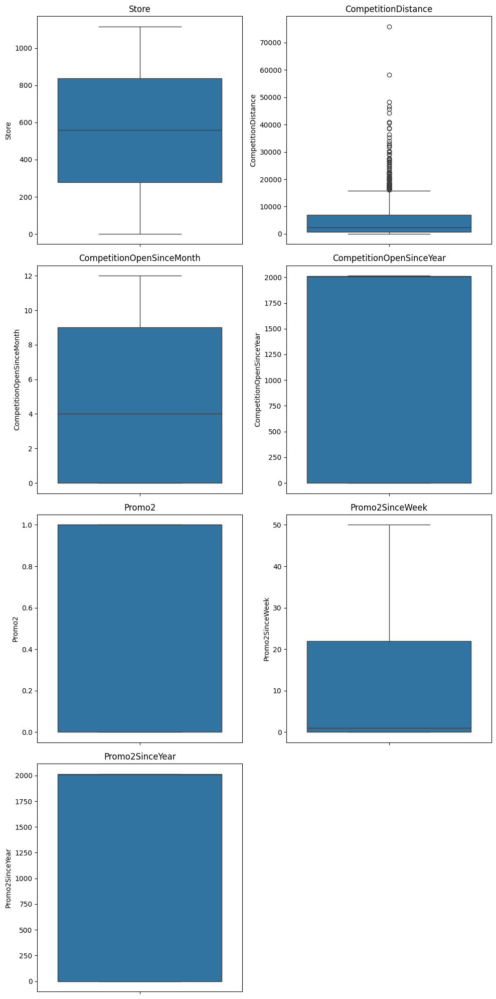

In [20]:


# Set the size of the figure and determine grid dimensions
num_cols = 2
num_rows = int(np.ceil(len(numerics_col_store) / num_cols))  # Calculate rows dynamically
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 20))  # Create grid of subplots

# Flatten axes array for easier iteration
axes = axes.ravel()

# Loop through columns and create box plots, iterating over both columns and axes
for i, column in enumerate(numerics_col_store):
    sns.boxplot(y=store_data[column], ax=axes[i])
    axes[i].set_title(column)

# Remove any unused subplots (if the number of columns doesn't perfectly divide the number of numeric columns)
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing for better visual appearance
plt.show()


#### Observation:
* CompetitionDistance has huge amount of outliers, which needs to be removed
* Promotion2SinceWeek has not lower quantile presence

In [21]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerics_col_train = train_data.select_dtypes(include=numerics).columns
numerics_col_train

Index(['Store', 'DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo',
       'SchoolHoliday'],
      dtype='object')

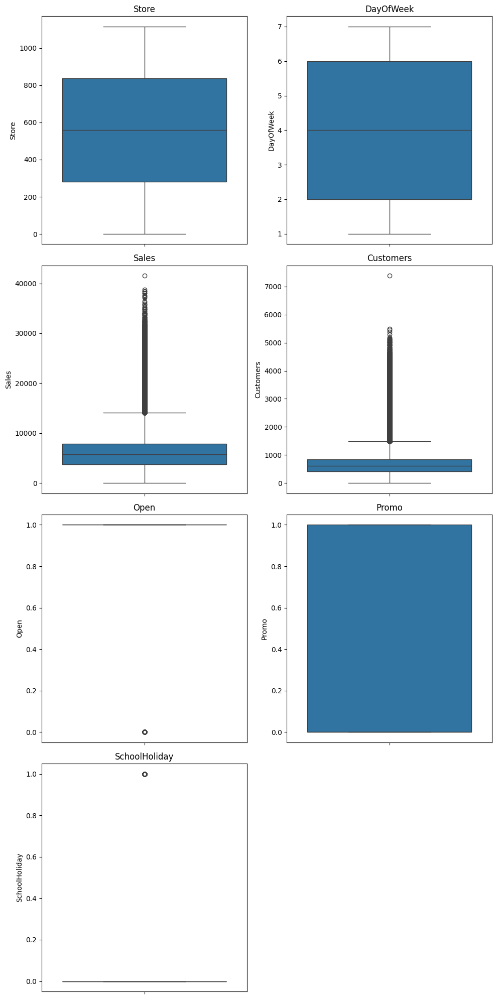

In [22]:
# Set the size of the figure and determine grid dimensions
num_cols = 2
num_rows = int(np.ceil(len(numerics_col_train) / num_cols))  # Calculate rows dynamically
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 20))  # Create grid of subplots

# Flatten axes array for easier iteration
axes = axes.ravel()

# Loop through columns and create box plots, iterating over both columns and axes
for i, column in enumerate(numerics_col_train):
    sns.boxplot(y=train_data[column], ax=axes[i])
    axes[i].set_title(column)

# Remove any unused subplots (if the number of columns doesn't perfectly divide the number of numeric columns)
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing for better visual appearance
plt.show()

#### Observation:
* Customer and Sales data has huge amount of outliers
* Open & School Holiday should not be factored as they have only few possible values


In [23]:
def remove_outliers_above_99th_percentile(data):

    filtered_data = data.copy()  # Start with a copy of the original data

    for column in data.select_dtypes(include=np.number):
        # Calculate the 99th percentile threshold
        quantile_99th = np.percentile(filtered_data[column], 99)

        # Filter out rows with outliers in the current column
        filtered_data = filtered_data[filtered_data[column] <= quantile_99th]

    return filtered_data

In [24]:
store_data = remove_outliers_above_99th_percentile(store_data)

In [25]:
train_data = remove_outliers_above_99th_percentile(train_data)

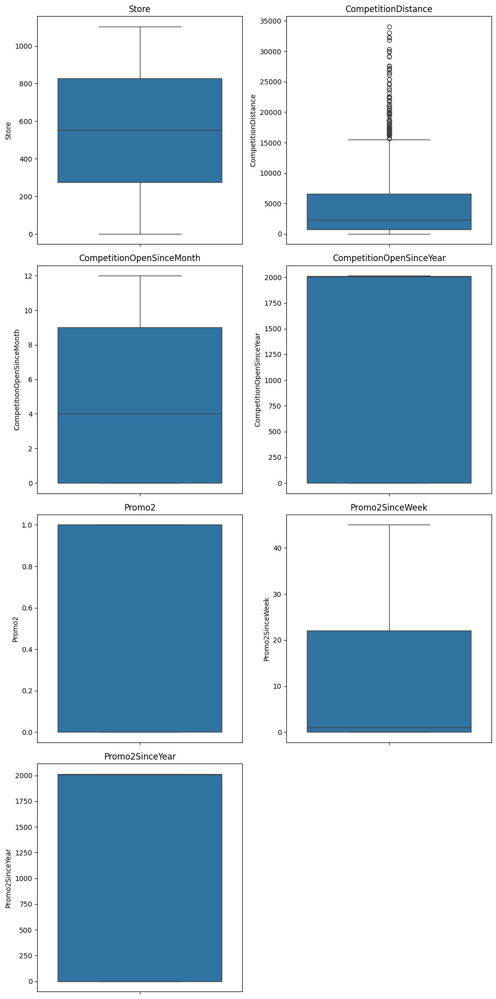

In [26]:


# Set the size of the figure and determine grid dimensions
num_cols = 2
num_rows = int(np.ceil(len(numerics_col_store) / num_cols))  # Calculate rows dynamically
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 20))  # Create grid of subplots

# Flatten axes array for easier iteration
axes = axes.ravel()

# Loop through columns and create box plots, iterating over both columns and axes
for i, column in enumerate(numerics_col_store):
    sns.boxplot(y=store_data[column], ax=axes[i])
    axes[i].set_title(column)

# Remove any unused subplots (if the number of columns doesn't perfectly divide the number of numeric columns)
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing for better visual appearance
plt.show()


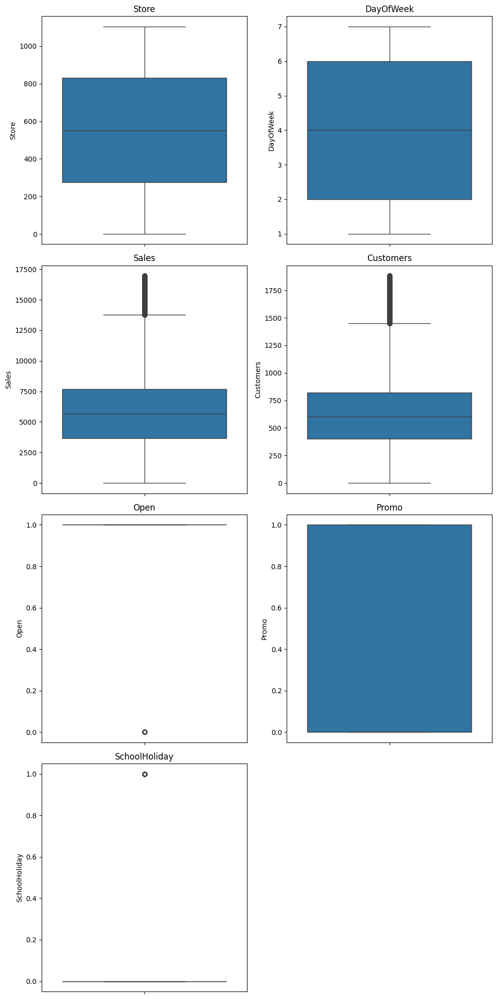

In [27]:
# Set the size of the figure and determine grid dimensions
num_cols = 2
num_rows = int(np.ceil(len(numerics_col_train) / num_cols))  # Calculate rows dynamically
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 20))  # Create grid of subplots

# Flatten axes array for easier iteration
axes = axes.ravel()

# Loop through columns and create box plots, iterating over both columns and axes
for i, column in enumerate(numerics_col_train):
    sns.boxplot(y=train_data[column], ax=axes[i])
    axes[i].set_title(column)

# Remove any unused subplots (if the number of columns doesn't perfectly divide the number of numeric columns)
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing for better visual appearance
plt.show()


## **Data Analysis**


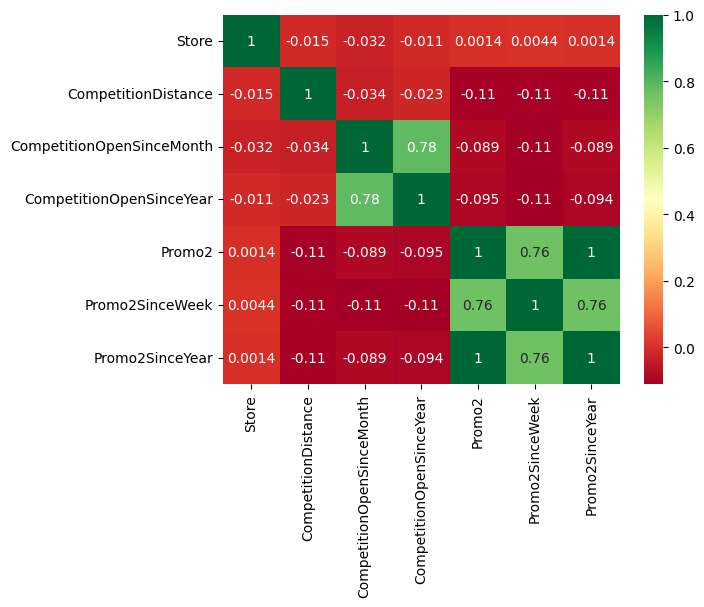

In [28]:
sns.heatmap(store_data.select_dtypes(include=numerics).corr(),annot=True,cmap='RdYlGn')
plt.show()

#### Observation
Strong positive correlations (dark red):
    high competition distance (farther competitor) might be associated with higher sales

Strong negative correlations (dark blue):
    a high number of customers might be negatively correlated with the presence of a school holiday .

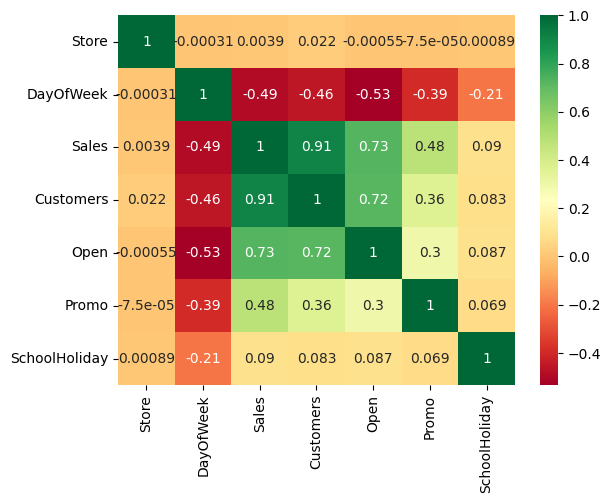

In [29]:
sns.heatmap(train_data.select_dtypes(include=numerics).corr(),annot=True,cmap='RdYlGn')
plt.show()

#### Observation
Strong positive correlations (dark red):
    A high number of customers (Customers) might be positively correlated with high sales (Sales). This makes intuitive sense, as more customers are likely to lead to more sales.
    
Strong negative correlations (dark blue):
    A store being open (Open) might be nzegatively correlated with a state holiday (StateHoliday). This is because stores are typically closed on state holidays.
    
Weak correlations (white or light colors):
    The day of the week (DayOfWeek) might not have a strong correlation with the number of customers (Customers).

In [30]:
train_data_columns = ['DayOfWeek','Open', 'Promo',	'StateHoliday'	,'SchoolHoliday']


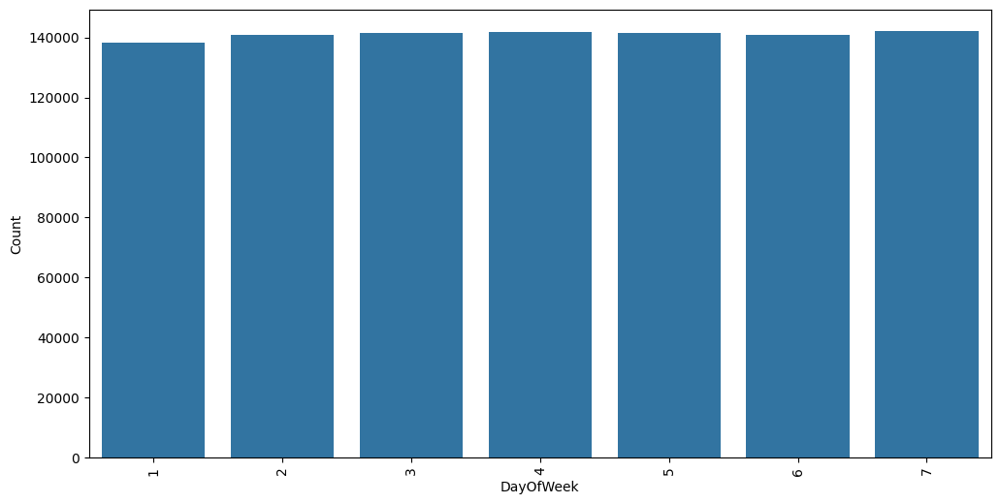

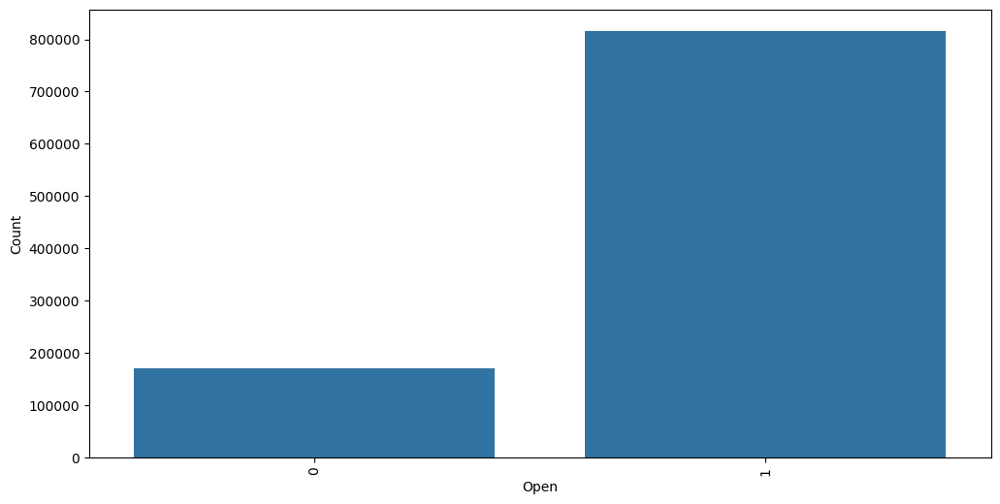

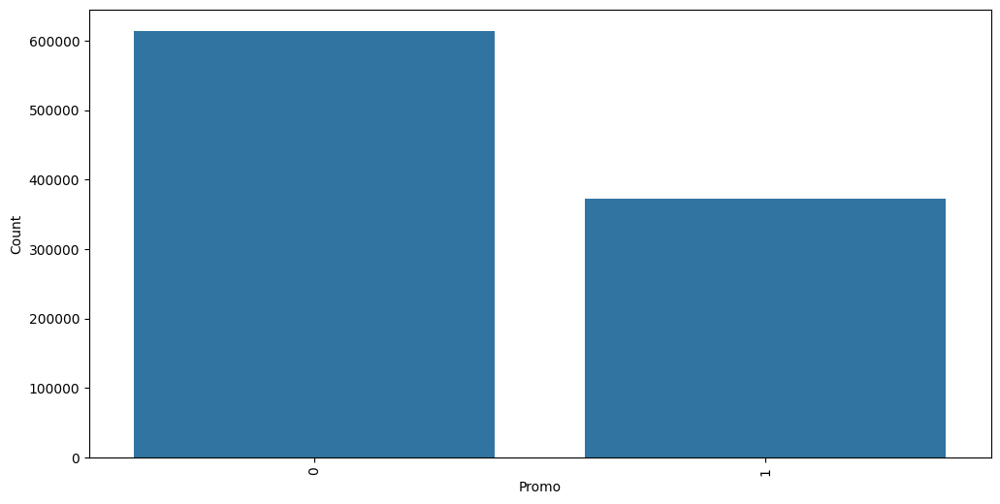

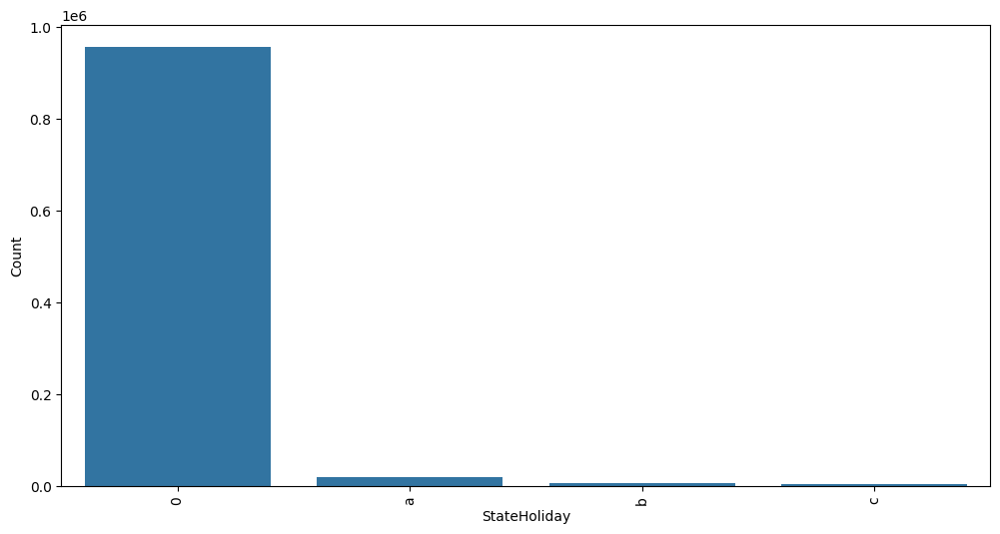

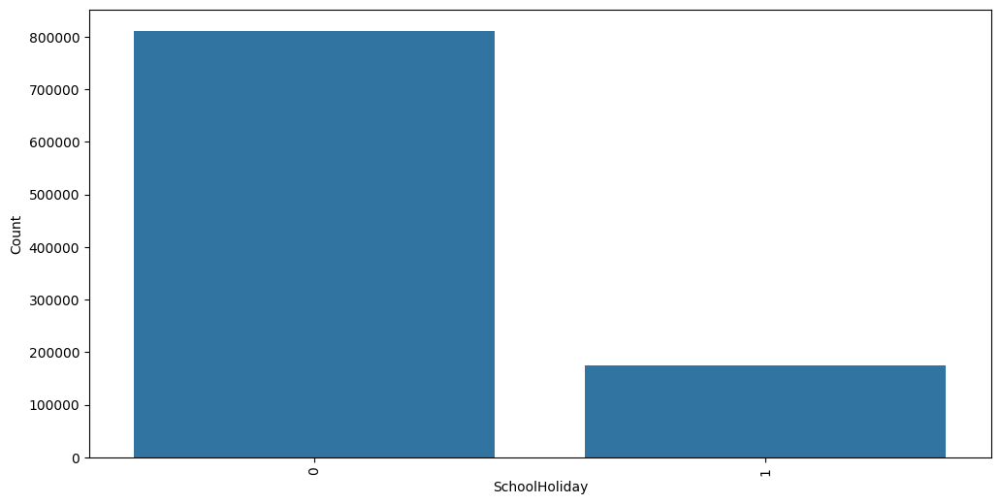

In [31]:
for col in train_data_columns:
  plt.figure(figsize=(12, 6))
  sns.countplot(x=col, data=train_data)
  plt.xticks(rotation=90)
  plt.xlabel(col)
  plt.ylabel("Count")
  plt.show()

#### Observation:
* The day of the week doesn't have a great impact on the sales
* The factor the store open or not has huge impact
* Promotion seems to boost the sales
* State holidays has a huge impact, as during holidays sales has falled down dramatically
* School Holiday has minor significant impact on sales

In [32]:
store_data_columns = ['StoreType','Assortment', 'Promo2']

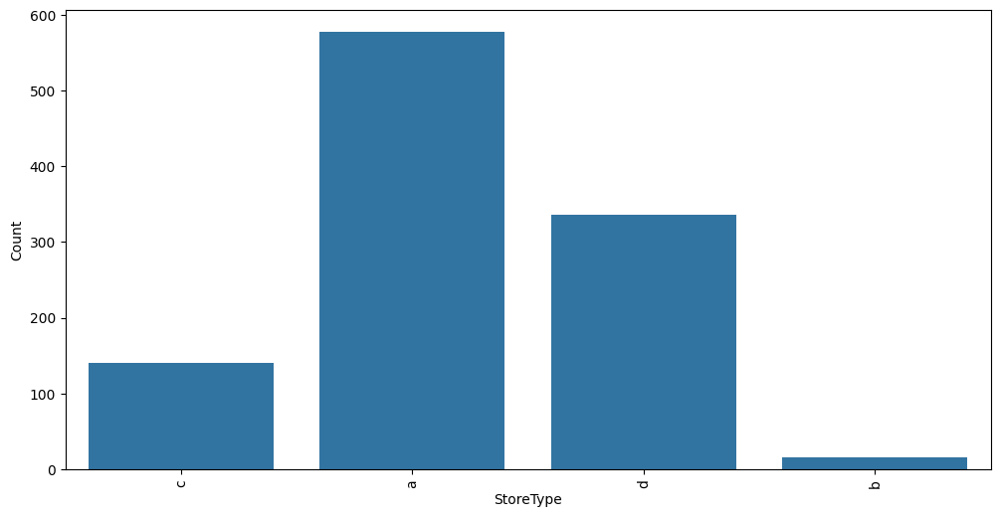

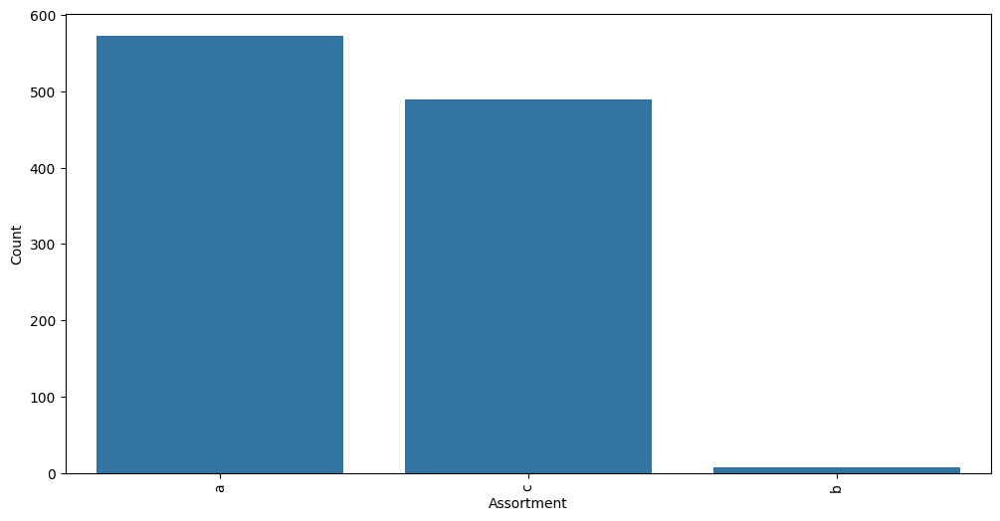

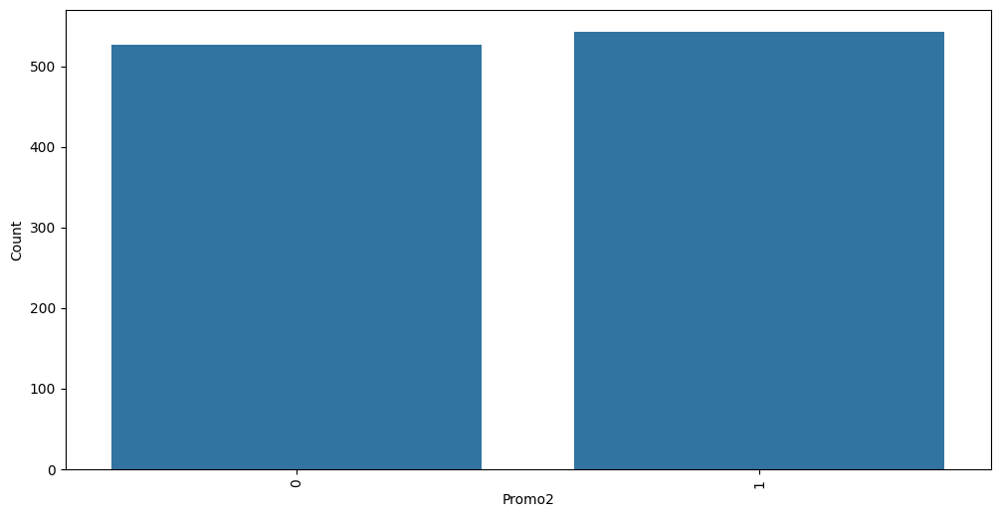

In [33]:
for col in store_data_columns:
  plt.figure(figsize=(12, 6))
  sns.countplot(x=col, data=store_data)
  plt.xticks(rotation=90)
  plt.xlabel(col)
  plt.ylabel("Count")
  plt.show()

#### Observation:
* Store Type A & D has huge impact
* Sort Type A & C has good impact, it is important to note that even sort has hight impact on sales
* Promo2 doesn't have any impact on sales on high level

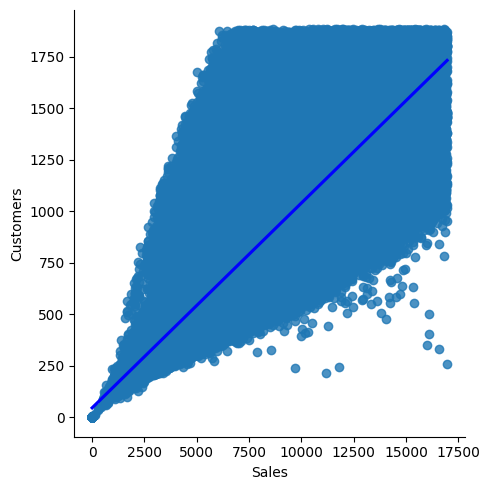

In [34]:
#linear relation between sales and customers
sns.lmplot(x= 'Sales' , y ='Customers',data=train_data, palette='seismic', height=5,aspect=1, line_kws={'color':'blue'});

## **Merged Data**

In [35]:
# Merging train and store data
df = pd.merge(train_data, store_data, how='left', on='Store')


In [36]:
df.head(10)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1.0,13.0,2010.0
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0.0,0.0,0.0
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0.0,0.0,0.0
5,6,5,2015-07-31,5651,589,1,1,0,1,a,a,310.0,12.0,2013.0,0.0,0.0,0.0
6,7,5,2015-07-31,15344,1414,1,1,0,1,a,c,24000.0,4.0,2013.0,0.0,0.0,0.0
7,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0.0,0.0,0.0
8,9,5,2015-07-31,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0,0.0,0.0,0.0
9,10,5,2015-07-31,7185,681,1,1,0,1,a,a,3160.0,9.0,2009.0,0.0,0.0,0.0


In [37]:
df.tail(10)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
987171,1095,2,2013-01-01,0,0,0,0,a,1,a,a,690.0,6.0,2007.0,1.0,14.0,2011.0
987172,1096,2,2013-01-01,0,0,0,0,a,1,a,c,1130.0,0.0,0.0,1.0,10.0,2014.0
987173,1097,2,2013-01-01,5961,1405,1,0,a,1,b,b,720.0,3.0,2002.0,0.0,0.0,0.0
987174,1098,2,2013-01-01,0,0,0,0,a,1,a,a,1830.0,11.0,2004.0,0.0,0.0,0.0
987175,1099,2,2013-01-01,0,0,0,0,a,1,a,c,200.0,4.0,2013.0,1.0,14.0,2013.0
987176,1100,2,2013-01-01,0,0,0,0,a,1,a,a,540.0,0.0,0.0,1.0,14.0,2011.0
987177,1101,2,2013-01-01,0,0,0,0,a,1,d,c,4060.0,9.0,2012.0,0.0,0.0,0.0
987178,1102,2,2013-01-01,0,0,0,0,a,1,a,a,850.0,11.0,2012.0,1.0,40.0,2014.0
987179,1103,2,2013-01-01,0,0,0,0,a,1,d,c,1340.0,10.0,2006.0,1.0,5.0,2013.0
987180,1104,2,2013-01-01,0,0,0,0,a,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
#replace the string NaN with np.nan for easier manipulation
df.replace("NaN",np.nan,inplace=True)

In [39]:
Predict_stores=[1,3,8,9,13,25,29,31,46]
df=df[df.Store.isin(Predict_stores)]
df.shape

(8004, 17)

In [40]:
round((df.isnull().sum()/len(df))*100,2)


Store                        0.0
DayOfWeek                    0.0
Date                         0.0
Sales                        0.0
Customers                    0.0
Open                         0.0
Promo                        0.0
StateHoliday                 0.0
SchoolHoliday                0.0
StoreType                    0.0
Assortment                   0.0
CompetitionDistance          0.0
CompetitionOpenSinceMonth    0.0
CompetitionOpenSinceYear     0.0
Promo2                       0.0
Promo2SinceWeek              0.0
Promo2SinceYear              0.0
dtype: float64

#### Observation
* After various imputation , we have the dataset with out null attributes

In [41]:
df['Date']=pd.to_datetime(df['Date'])


#### Observation
As closed stores is not having great impact on sales we can drop the colums from the dataset

In [42]:

df = df[df['Open'] != 0]
df = df.drop('Open', axis=1)
df.shape

(6575, 16)

In [43]:
# checking for any opened store with zero sales
df[df['Sales'] == 0]

,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
544439,25,4,2014-02-13,0,0,0,0,0,c,a,430.0,4.0,2003.0,0.0,0.0,0.0
545531,25,3,2014-02-12,0,0,0,0,0,c,a,430.0,4.0,2003.0,0.0,0.0,0.0


In [44]:
# removing such stores from df
df = df[df['Sales'] != 0]
df.shape

(6573, 16)

**ScatterPlot**

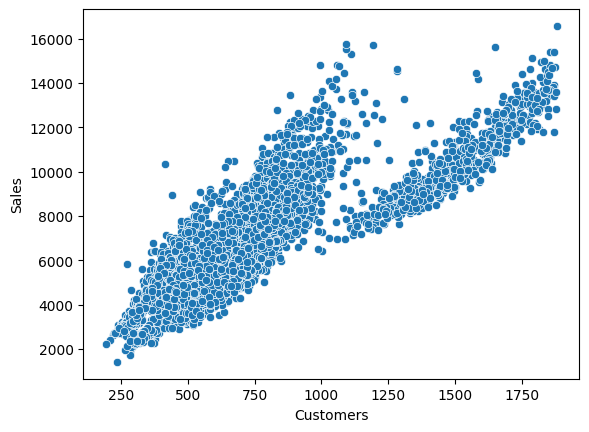

In [45]:
# Boxplots of Customers against Sales

sns.scatterplot(x = 'Customers', y = 'Sales', data = df)
plt.show()

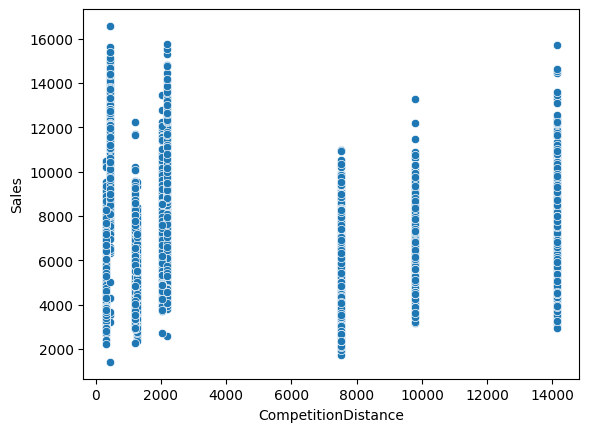

In [46]:
# Boxplots of Customers against Sales

sns.scatterplot(x = 'CompetitionDistance', y = 'Sales', data = df)
plt.show()

#### Observation
* The sales are predominantly present from 0 - 2000 as continous, we can observe the more the competion the more sales it is.


**Multivariate Analysis**


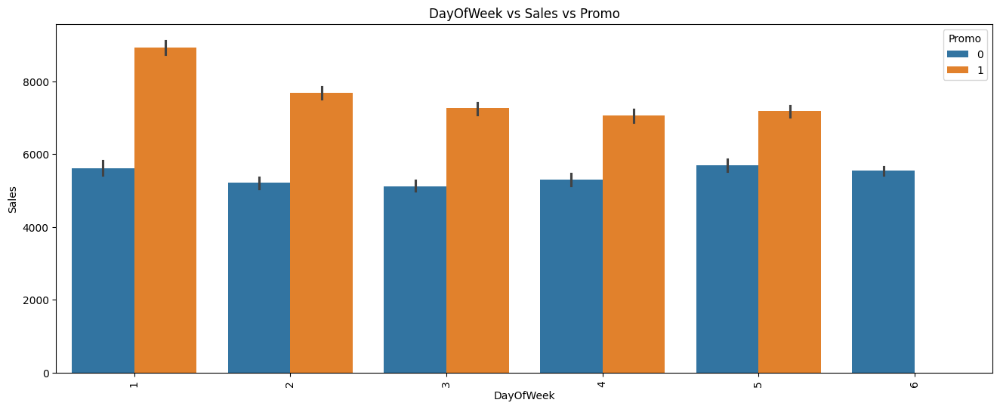

In [47]:
# Checking co-relation between Sales vs Days vs Promo

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Sales',hue='Promo',data=df)
plt.title("DayOfWeek vs Sales vs Promo")
plt.xticks(rotation = 90)
plt.show()

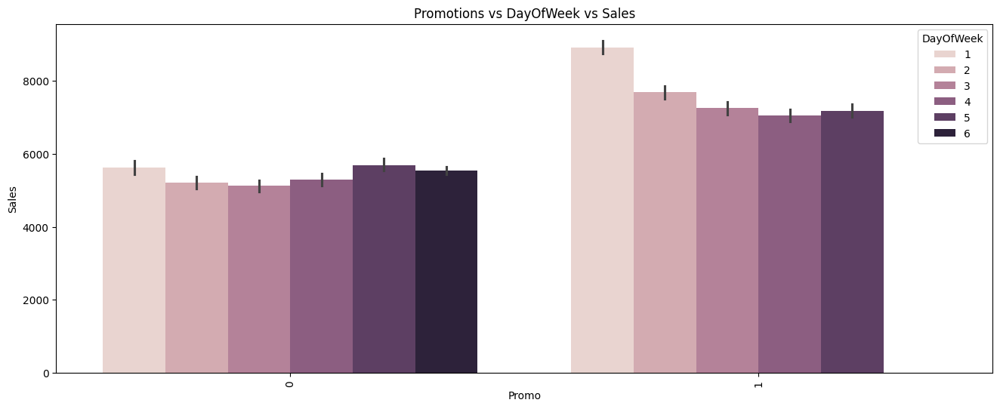

In [48]:
# Checking co-relation between Promo vs Days

plt.figure(figsize=(16, 6))
sns.barplot(x='Promo',y='Sales',hue='DayOfWeek',data=df)
plt.title("Promotions vs DayOfWeek vs Sales")
plt.xticks(rotation = 90)
plt.show()

Days at the start of the week are higher Sales than sales of other days



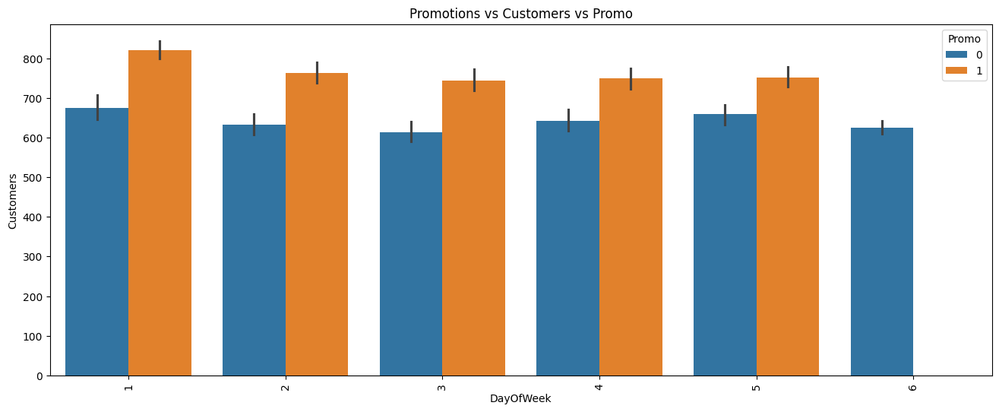

In [49]:
# Checking co-relation between Days vs Customers vs Promo

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Customers',hue='Promo',data=df)
plt.title("Promotions vs Customers vs Promo")
plt.xticks(rotation = 90)
plt.show()

Customers are higher on weekdays and when promotios are active

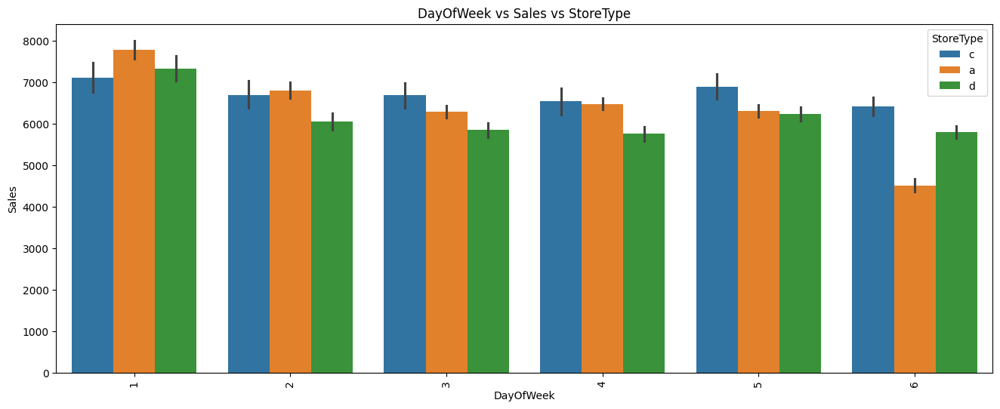

In [50]:
# Checking co-relation between Days vs Sales vs StoreType

plt.figure(figsize=(16, 6))
sns.barplot(x='DayOfWeek',y='Sales',hue='StoreType',data=df)
plt.title("DayOfWeek vs Sales vs StoreType")
plt.xticks(rotation = 90)
plt.show()

**For numerical variables**


<Figure size 4000x4000 with 0 Axes>

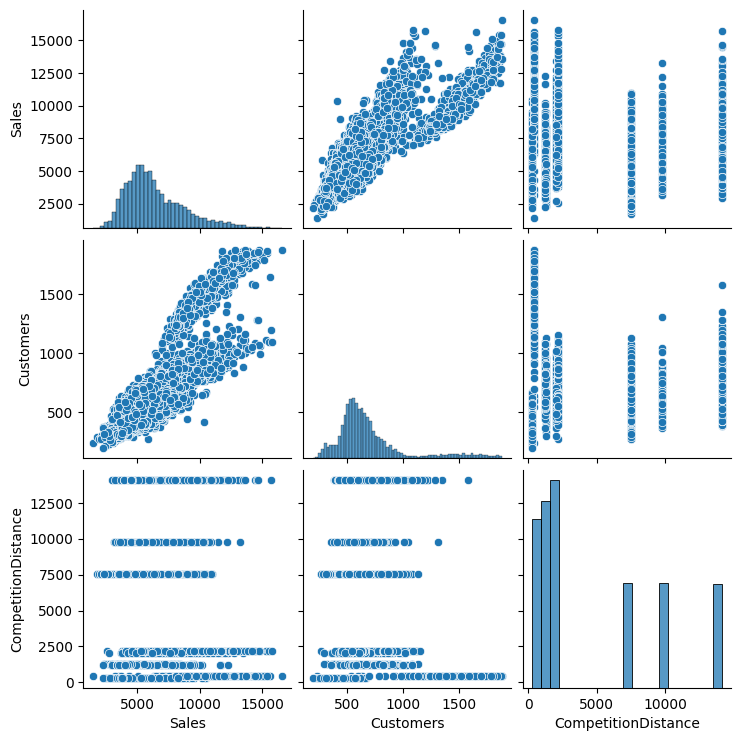

In [51]:
# Pairwise plot

plt.figure(figsize=(40, 40))
sns.pairplot(df[['Sales','Customers','CompetitionDistance']])
plt.show()

From the plot, we can see that as customers increase, sales also increases.

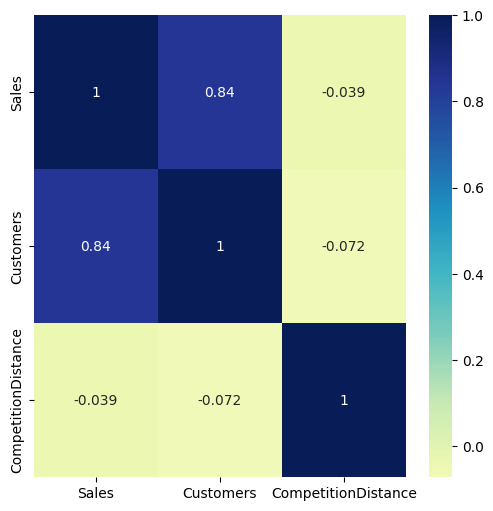

In [52]:
# Checking co-relation coefficients for numercial variables

# plot heat map for corr
cor = df[['Sales','Customers','CompetitionDistance']].corr()
plt.figure(figsize = (6, 6))
sns.heatmap(cor, annot = True,center=0.4,cmap="YlGnBu")
plt.show()

## **Time Series Analysis**

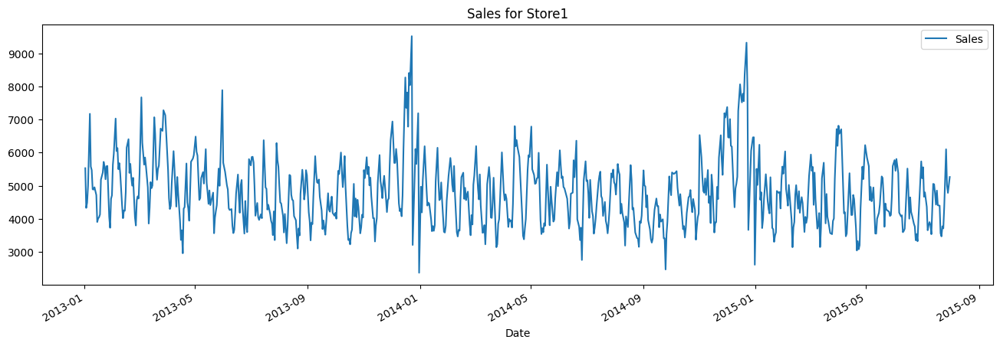

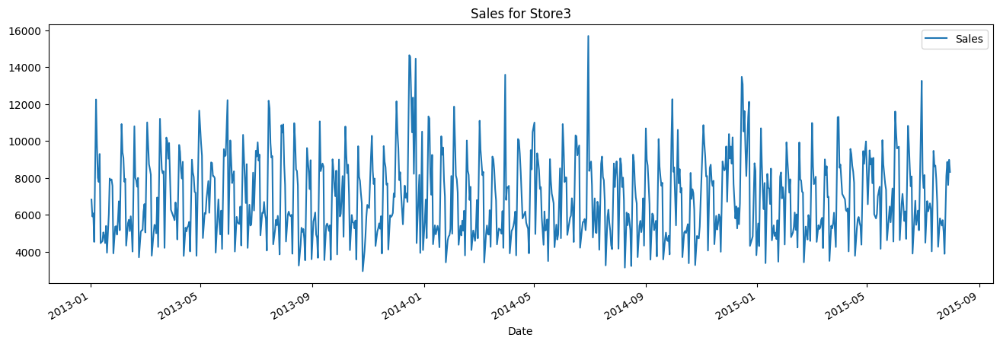

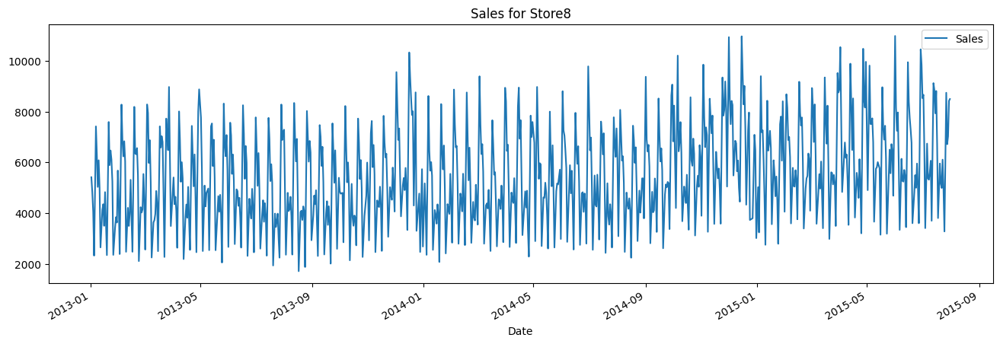

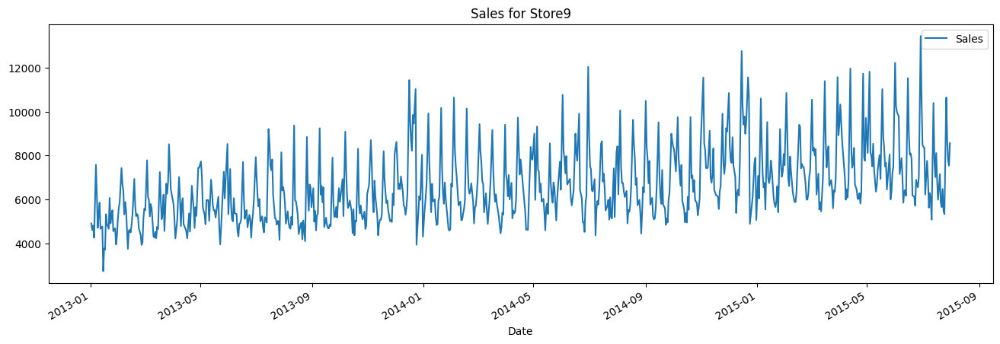

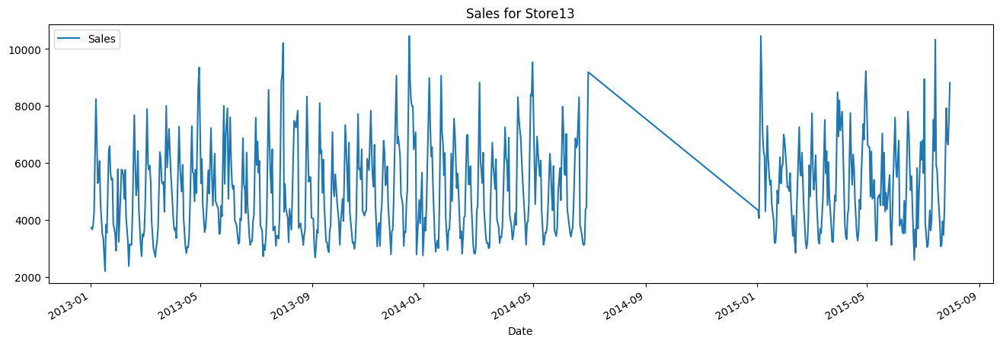

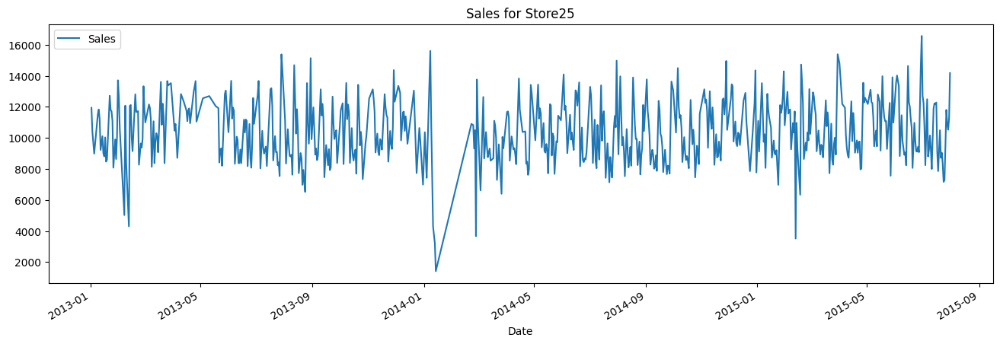

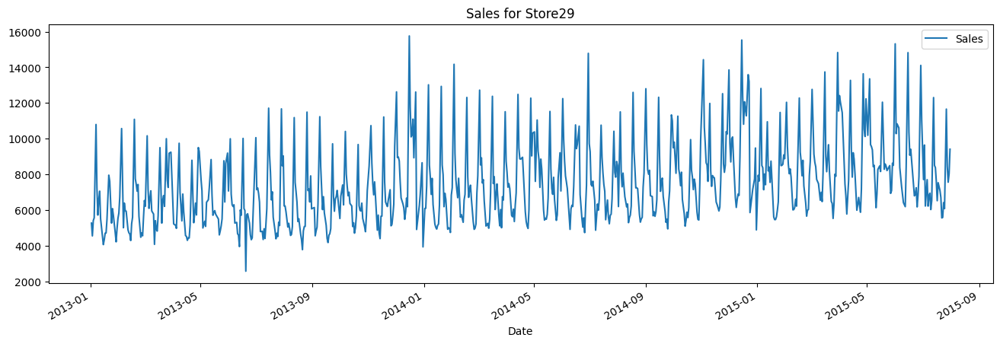

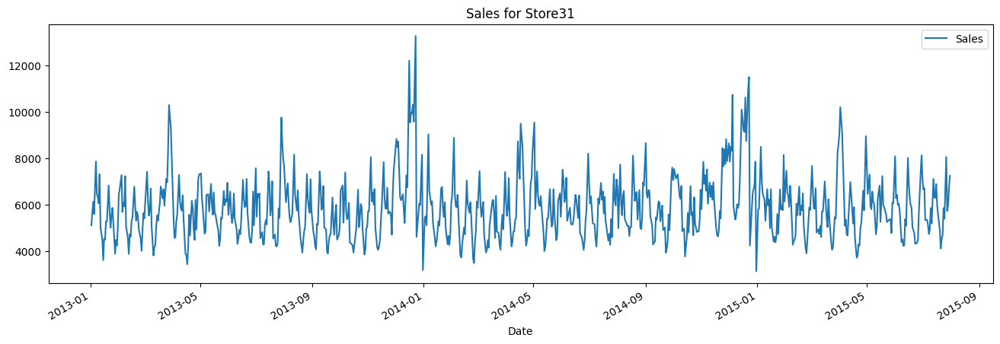

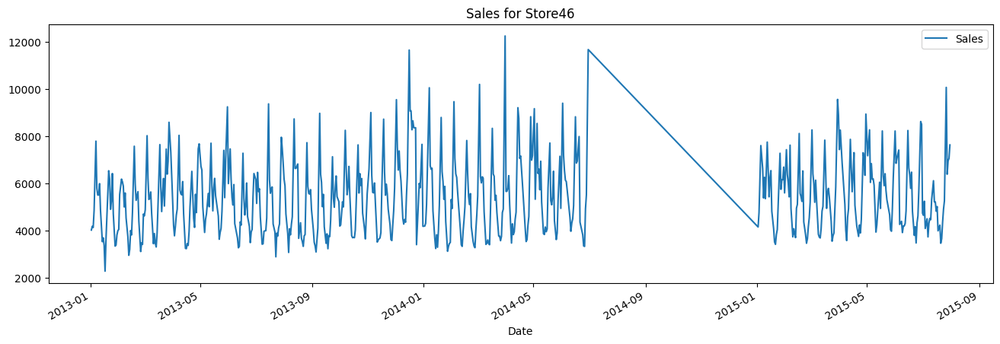

In [53]:
for store in Predict_stores:
    df[df.Store == store].plot(x="Date",y='Sales',figsize = (16,5))
    plt.title('Sales for Store'+str(store))

    plt.show(block=False)

### For finer attribute control - Let us split the date into three separate attributes as
* Year
* Month
* Day

In [54]:
df['Year'] = df.Date.dt.year
df['Month'] = df.Date.dt.month
df['Day'] = df.Date.dt.day
df.shape

(6573, 19)

In [55]:
df.head()


,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
0,1,5,2015-07-31,5263,555,1,0,1,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,7,31
2,3,5,2015-07-31,8314,821,1,0,1,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,7,31
7,8,5,2015-07-31,8492,833,1,0,1,a,a,7520.0,10.0,2014.0,0.0,0.0,0.0,2015,7,31
8,9,5,2015-07-31,8565,687,1,0,1,a,c,2030.0,8.0,2000.0,0.0,0.0,0.0,2015,7,31
12,13,5,2015-07-31,8821,568,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,31


In [56]:
#Creating seprate df for each store
Store_Data={}
for store in Predict_stores:
    Store_Data[store]=df[df.Store == store].set_index(['Date'])

In [57]:
Store_Data[13].head()

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2015-07-31,13,5,8821,568,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,31
2015-07-30,13,4,7648,474,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,30
2015-07-29,13,3,6648,406,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,29
2015-07-28,13,2,6819,446,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,28
2015-07-27,13,1,7926,527,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2015,7,27


In [58]:
Store_Data[13][
    (Store_Data[13]['Year'] == 2014) &
    (Store_Data[13]['Month'].isin([6,7, 8, 9, 10, 11, 12]))
]

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2014-06-30,13,1,9192,585,1,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,30
2014-06-28,13,6,4455,330,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,28
2014-06-27,13,5,4376,344,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,27
2014-06-26,13,4,3165,283,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,26
2014-06-25,13,3,3123,268,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,25
2014-06-24,13,2,3214,292,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,24
2014-06-23,13,1,3496,320,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,23
2014-06-21,13,6,3847,324,0,0,0,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,21
2014-06-20,13,5,8313,568,1,0,1,d,a,310.0,0.0,0.0,1.0,45.0,2009.0,2014,6,20


#### Observation:
there is no data present of store 13 in year 2014 of month 7 to 12

### Converting date to the index for ploting of date range time series

In [59]:
# function to fill date
def fill_Dates(DataFrame):
    """
    Fills in missing dates in a DataFrame's DatetimeIndex.

    Args:
        df (pd.DataFrame): The DataFrame to process. Assumes the index is either already a
                           DatetimeIndex or can be converted to one.

    Returns:
        pd.DataFrame: The DataFrame with a complete and continuous DatetimeIndex,
                      filled with NaN values for missing dates.
    """

    i = pd.date_range(DataFrame.index.min(), DataFrame.index.max())

    DataFrame.index = pd.DatetimeIndex(DataFrame.index)
    DataFrame = DataFrame.reindex(i, fill_value=np.nan)
    DataFrame.index.name = 'Date'
    return DataFrame


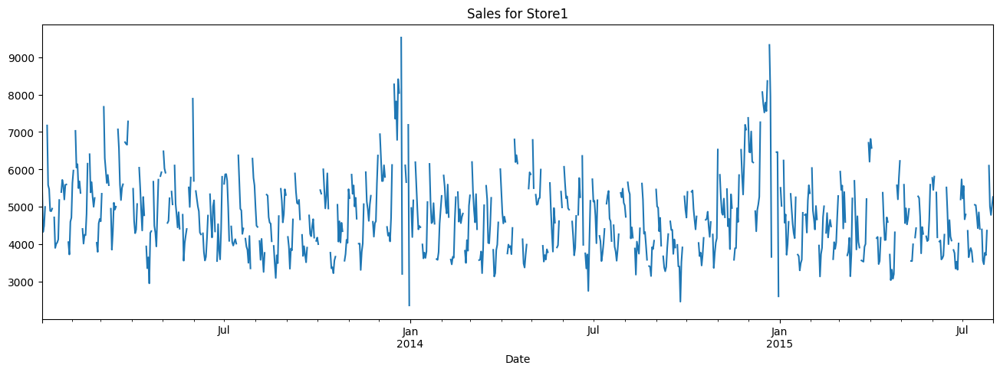

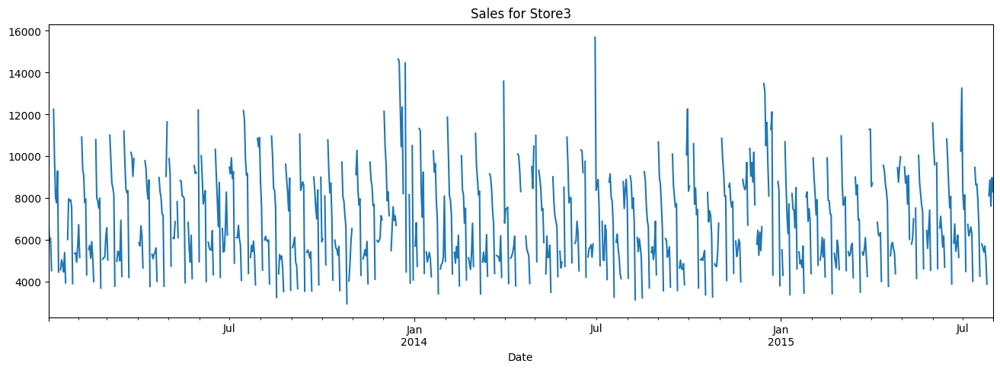

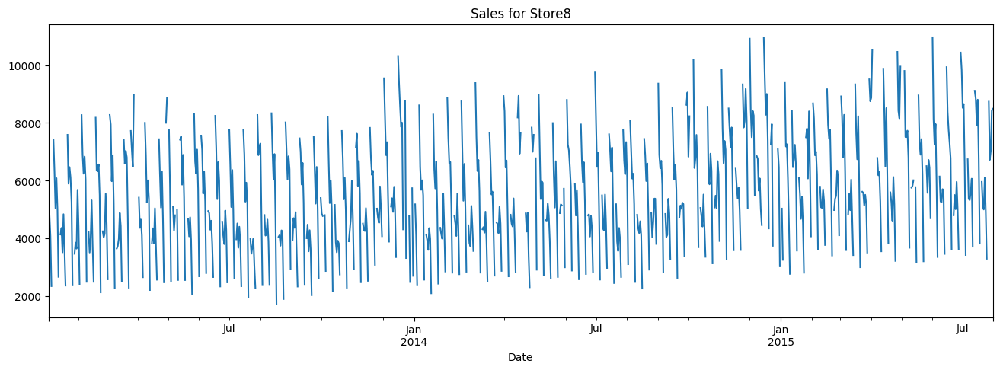

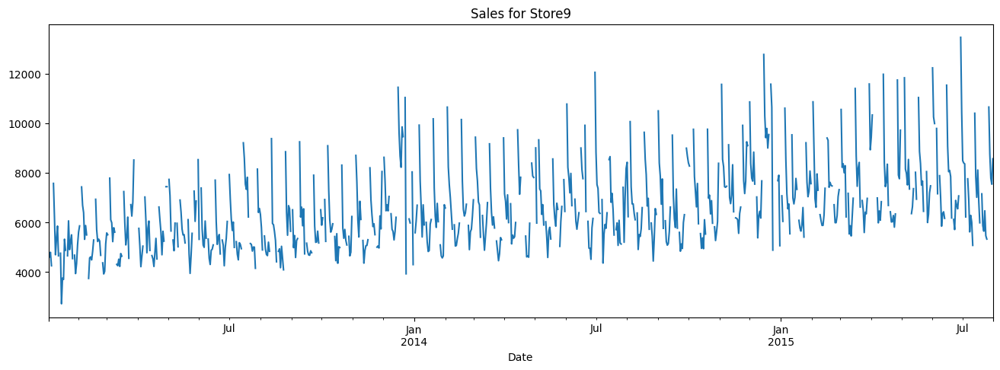

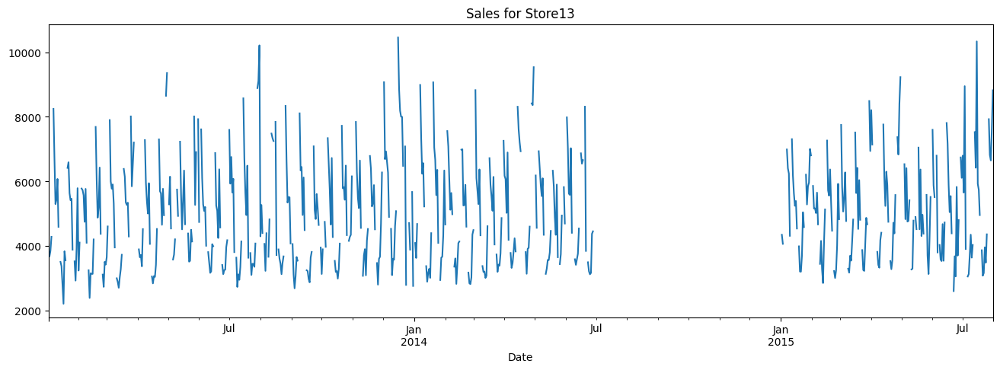

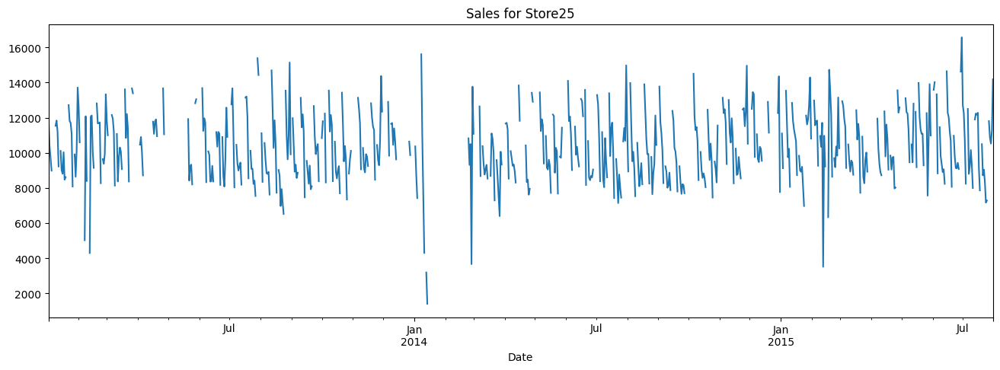

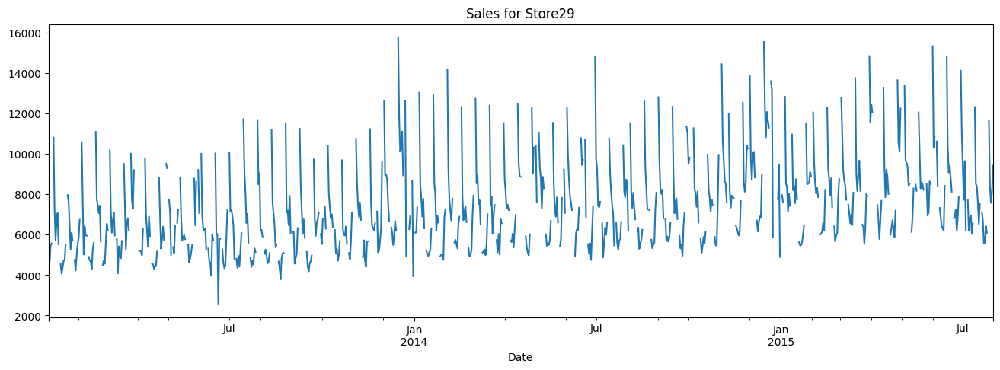

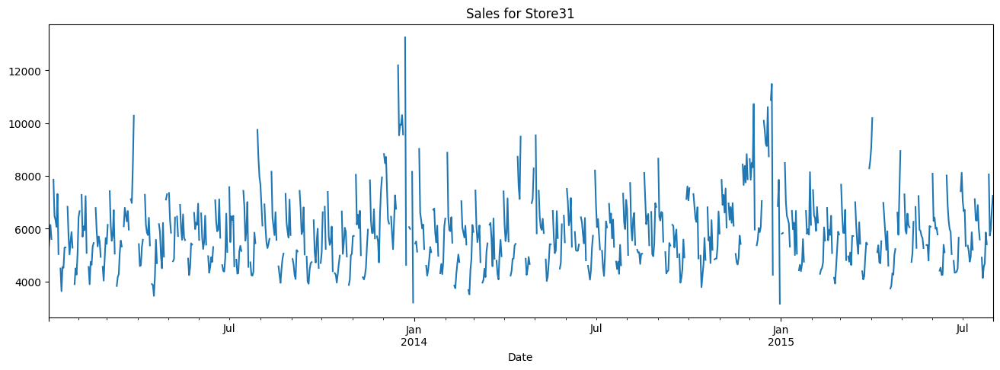

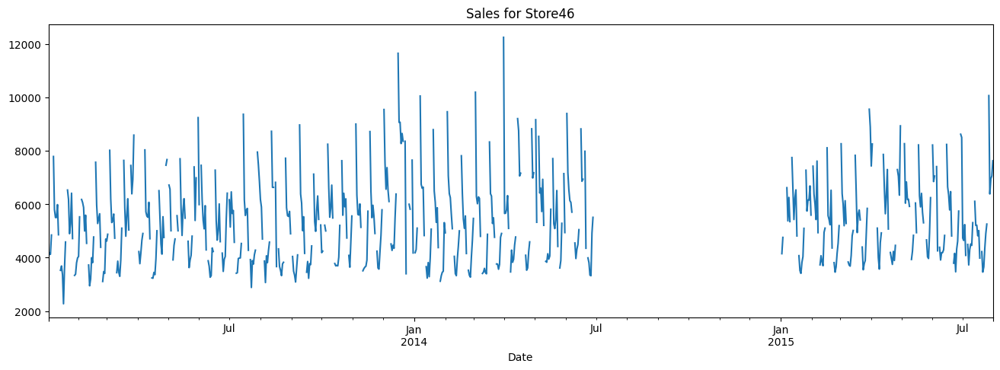

In [60]:
# StoreData[store]['Customers'].plot(y='Sales',figsize = (15,6))
for store in Predict_stores:
  Store_Data[store]=fill_Dates(Store_Data[store])
  Store_Data[store]['Sales'].astype(float).plot(y='Sales',figsize = (16,5))
  plt.title('Sales for Store'+str(store))

  plt.show(block=False)

#### Observation:
* We can observe that all the data is not continous
* for the many stores we do not have sales data for all the days

### impute missing data in a DataFrame by using the data from the same date in the previous year

In [61]:
 #imputing data with same date data from last year
# importing required library
from dateutil.relativedelta import relativedelta

def prev_yr_block_replace(data,startdate,enddate,store,column):
    for index, row in data.iterrows():
        if ((pd.isna(row[column]) and (index.strftime("%Y-%m-%d") > startdate) and (index.strftime("%Y-%m-%d") < enddate))):
            dates=pd.to_datetime(index)
            previous_Year_Date=dates- relativedelta(years=1)
            previous_Year_Date= previous_Year_Date.strftime("%Y-%m-%d")
            previous_Year_Data=Store_Data[store][Store_Data[store].index==previous_Year_Date][column]
            Store_Data[store].loc[index.strftime("%Y-%m-%d"), column]=previous_Year_Data.get(previous_Year_Date)

In [62]:
prev_yr_block_replace(Store_Data[13],'2014-07-01','2015-01-02',13,'Sales')
prev_yr_block_replace(Store_Data[13],'2014-07-01','2015-01-02',13,'Customers')
prev_yr_block_replace(Store_Data[25],'2014-01-01','2015-03-02',25,'Sales')
prev_yr_block_replace(Store_Data[25],'2014-01-01','2015-03-02',25,'Customers')
prev_yr_block_replace(Store_Data[46],'2014-07-01','2015-01-02',46,'Sales')
prev_yr_block_replace(Store_Data[46],'2014-07-01','2015-01-02',46,'Customers')

In [63]:
Store_Data[46][(Store_Data[46].index >'2014-07-15') & (Store_Data[46].index <'2015-01-02')]


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2014-07-16,NaN,NaN,6157.0,690.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-17,NaN,NaN,5579.0,686.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-18,NaN,NaN,5781.0,714.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-19,NaN,NaN,5844.0,708.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-20,NaN,NaN,4276.0,619.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-28,NaN,NaN,5814.0,738.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-12-30,NaN,NaN,7652.0,937.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Iterate the Sales, Customer trend as timeseries with period as 12 (default time period)

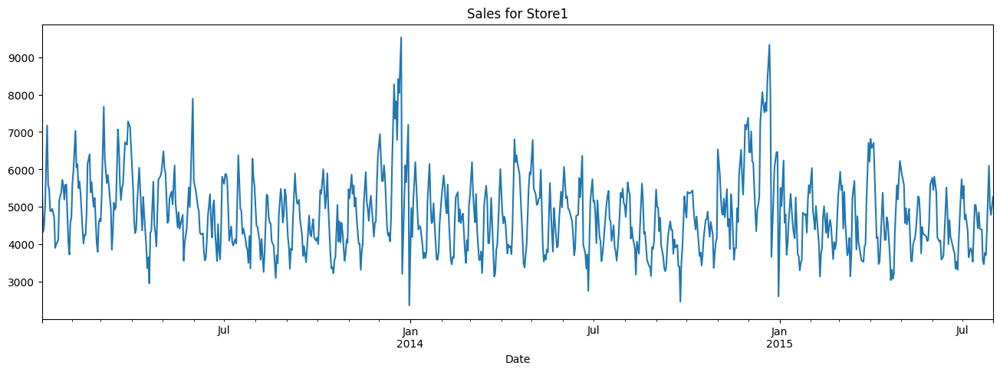

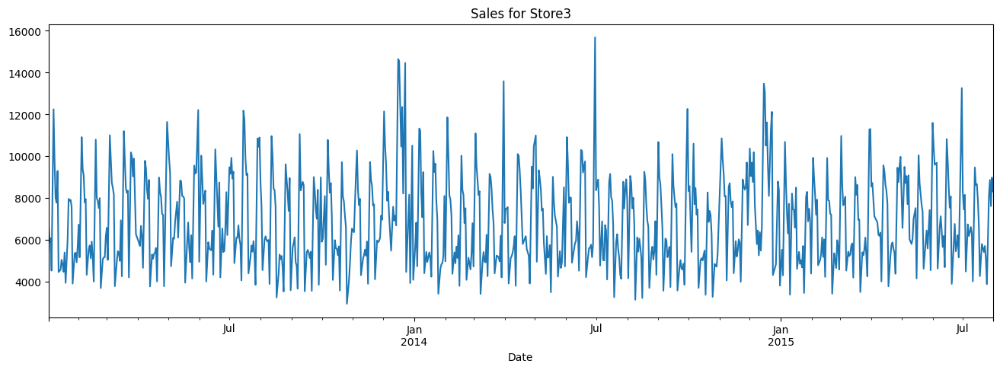

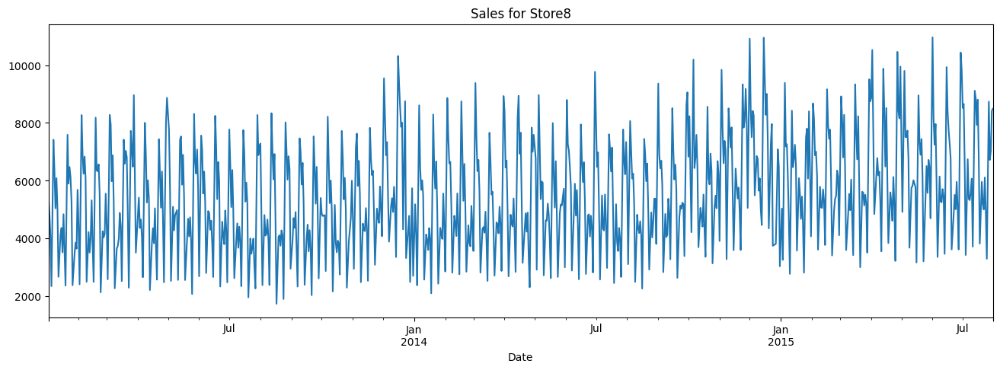

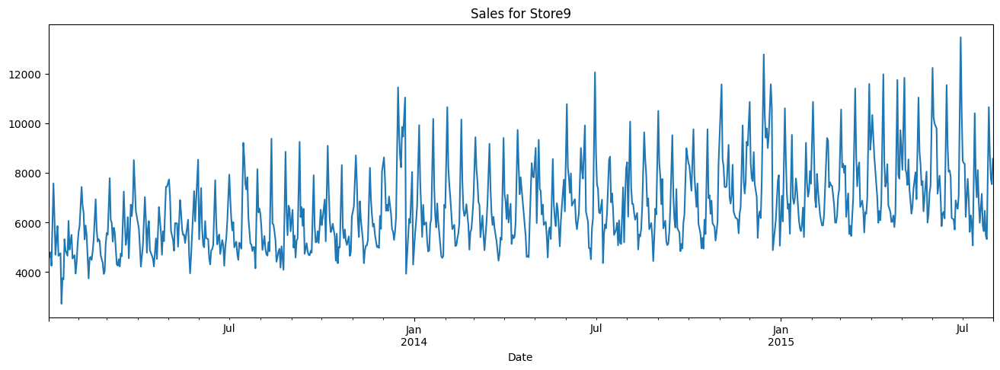

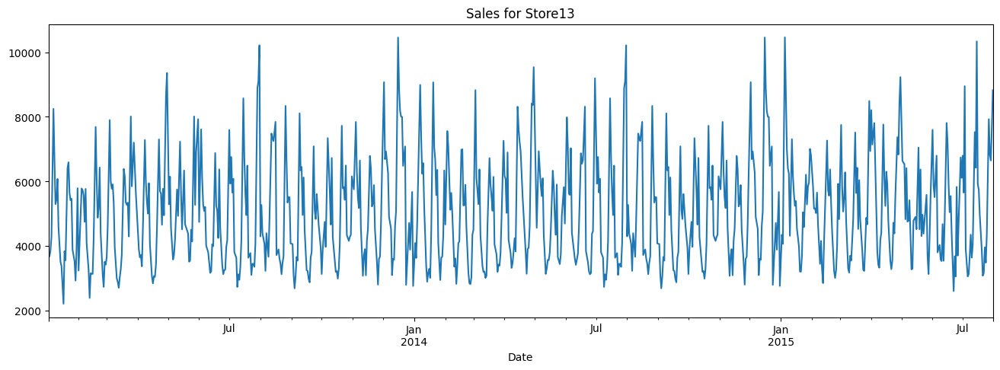

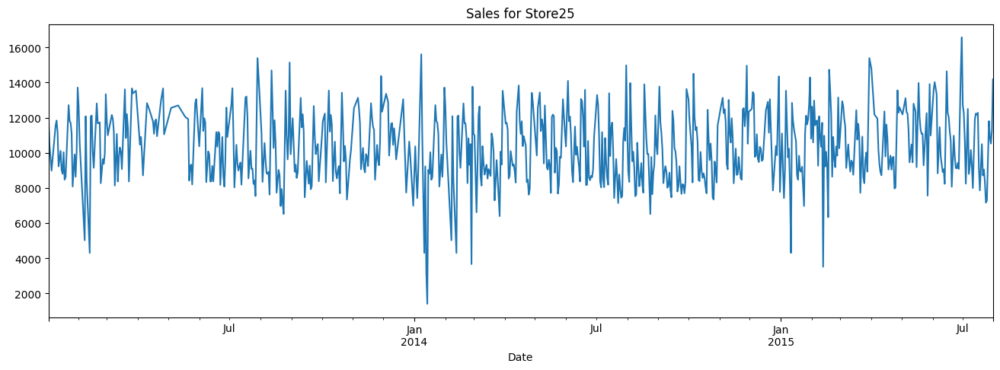

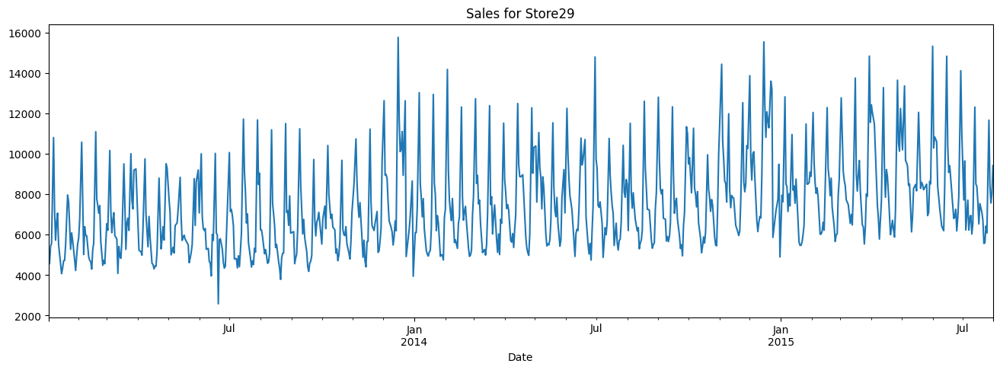

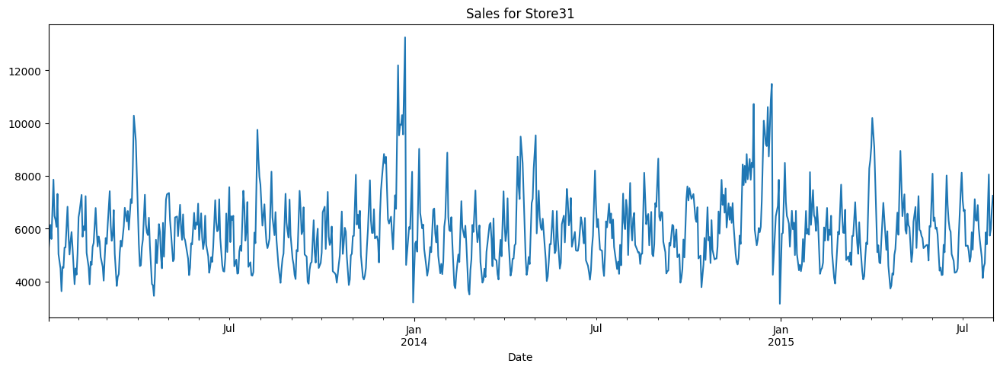

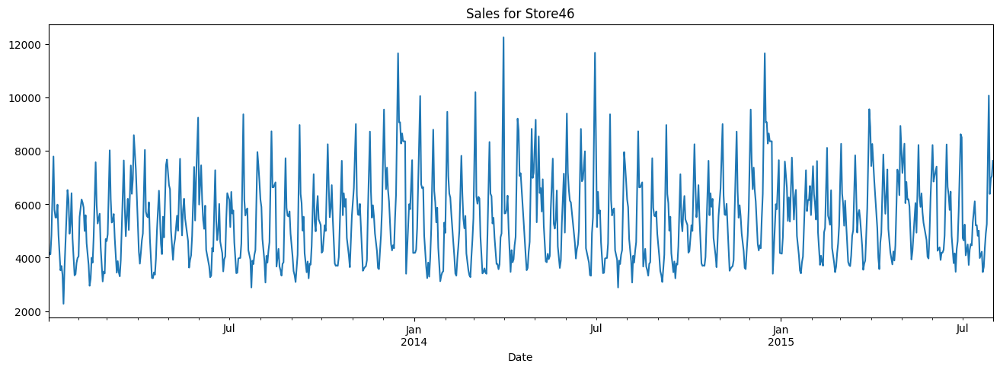

In [64]:
for store in Predict_stores:
    Store_Data[store]=fill_Dates(Store_Data[store])
    Store_Data[store]['Sales'].replace("NaN",np.nan,inplace=True)
    Store_Data[store]['Sales']=Store_Data[store]['Sales'].interpolate(method="linear")
    Store_Data[store]['Customers'].replace("NaN",np.nan,inplace=True)
    Store_Data[store]['Customers']=Store_Data[store]['Customers'].interpolate(method="linear")
    Store_Data[store]['Sales'].astype(float).plot(y='Sales',figsize = (16,5),)
    plt.title('Sales for Store'+str(store))

    plt.show(block=False)

In [65]:
for store in Predict_stores:

    #columns for train data
    Store_Data[store]['Promo'].fillna(Store_Data[store]['Promo'].mode()[0], inplace=True)
    Store_Data[store]['StateHoliday'].fillna(Store_Data[store]['StateHoliday'].mode()[0], inplace=True)
    Store_Data[store]['SchoolHoliday'].fillna(Store_Data[store]['SchoolHoliday'].mode()[0], inplace=True)
    Store_Data[store]['Store'].fillna(store, inplace=True)

    #columns from store data
    Store_Data[store]['StoreType'] = Store_Data[store]['StoreType'].ffill().bfill()
    Store_Data[store]['Assortment'] = Store_Data[store]['Assortment'].ffill().bfill()

    Store_Data[store]['Promo2'] = Store_Data[store]['Promo2'].ffill().bfill()
    Store_Data[store]['Promo2SinceWeek'] = Store_Data[store]['Promo2SinceWeek'].ffill().bfill()
    Store_Data[store]['Promo2SinceYear'] = Store_Data[store]['Promo2SinceYear'].ffill().bfill()


    Store_Data[store]['CompetitionDistance'] = Store_Data[store]['CompetitionDistance'].ffill().bfill()
    Store_Data[store]['CompetitionOpenSinceMonth'] = Store_Data[store]['CompetitionOpenSinceMonth'].ffill().bfill()
    Store_Data[store]['CompetitionOpenSinceYear'] = Store_Data[store]['CompetitionOpenSinceYear'].ffill().bfill()


    Store_Data[store]['Year'] = Store_Data[store].index.year
    Store_Data[store]['Month'] = Store_Data[store].index.month
    Store_Data[store]['Day'] = Store_Data[store].index.day
    Store_Data[store]['DayOfWeek'] = Store_Data[store].index.dayofweek




      #capping
    percentiles = Store_Data[store]['Sales'].quantile([0.01,0.99]).values
    Store_Data[store]['Sales'][Store_Data[store]['Sales'] <= percentiles[0]] = percentiles[0]
    Store_Data[store]['Sales'][Store_Data[store]['Sales'] >= percentiles[1]] = percentiles[1]


    percentiles = Store_Data[store]['Customers'].quantile([0.01,0.99]).values
    Store_Data[store]['Customers'][Store_Data[store]['Customers'] <= percentiles[0]] = percentiles[0]
    Store_Data[store]['Customers'][Store_Data[store]['Customers'] >= percentiles[1]] = percentiles[1]


In [66]:
Store_Data[46][(Store_Data[46].index >'2014-07-15') & (Store_Data[46].index <'2015-01-02')]


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2014-07-16,46.0,2,6157.0,690.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,7,16
2014-07-17,46.0,3,5579.0,686.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,7,17
2014-07-18,46.0,4,5781.0,714.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,7,18
2014-07-19,46.0,5,5844.0,708.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,7,19
2014-07-20,46.0,6,4276.0,619.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,7,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-28,46.0,6,5814.0,738.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,12,28
2014-12-29,46.0,0,6733.0,837.5,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,12,29
2014-12-30,46.0,1,7652.0,937.0,0.0,0,0.0,c,a,1200.0,9.0,2005.0,1.0,14.0,2011.0,2014,12,30


In [67]:
Store_Data[46].isnull().sum()


Store                        0
DayOfWeek                    0
Sales                        0
Customers                    0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
Year                         0
Month                        0
Day                          0
dtype: int64

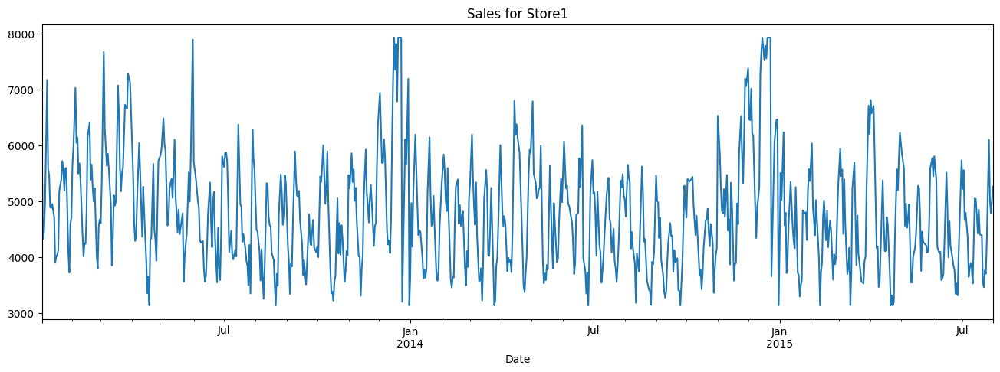

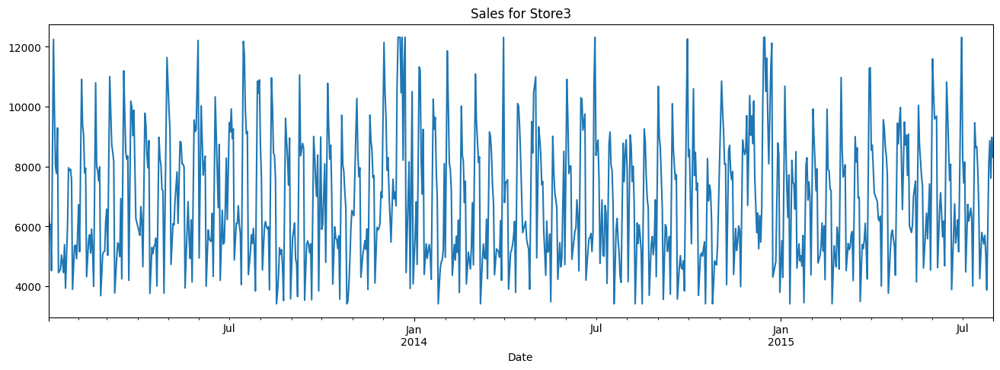

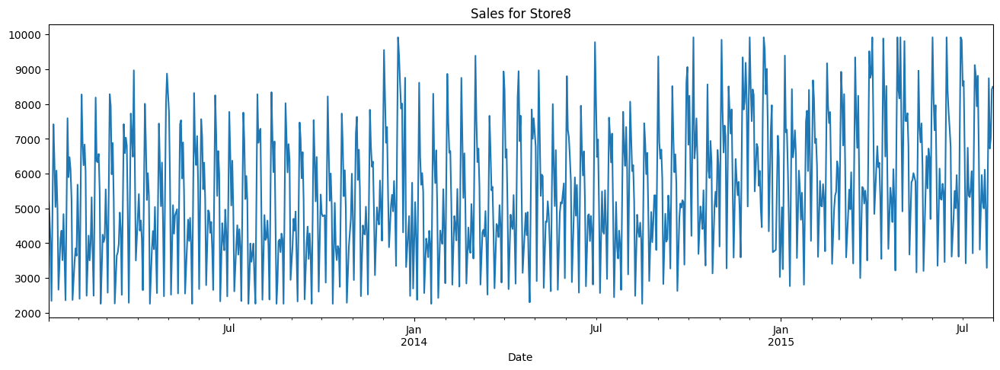

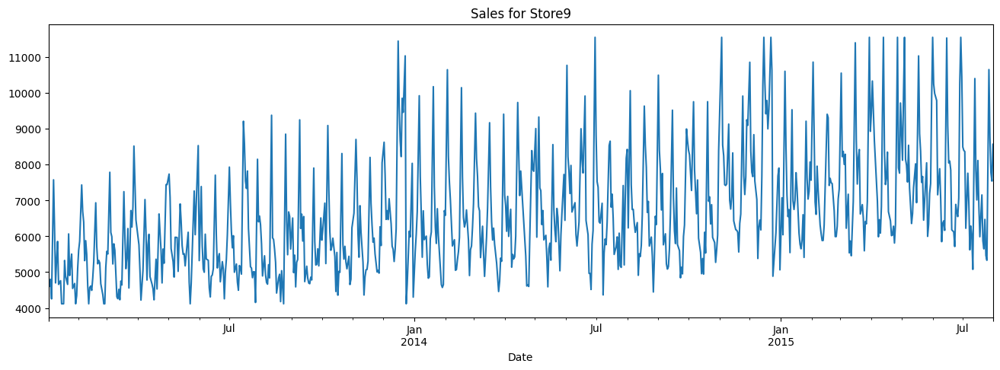

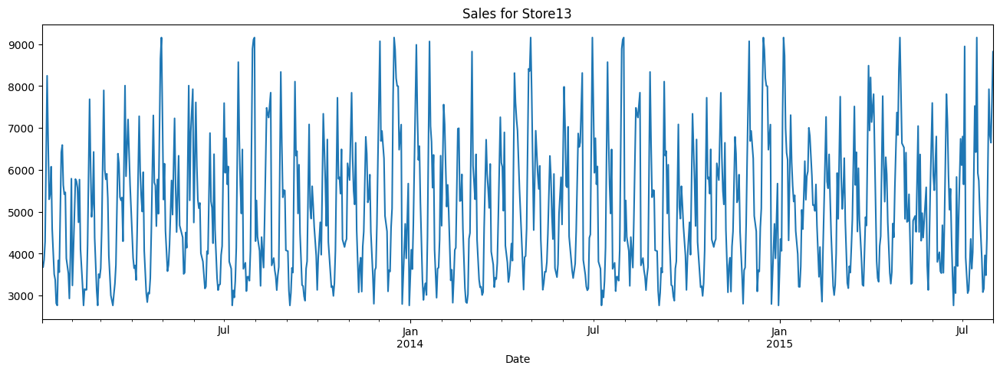

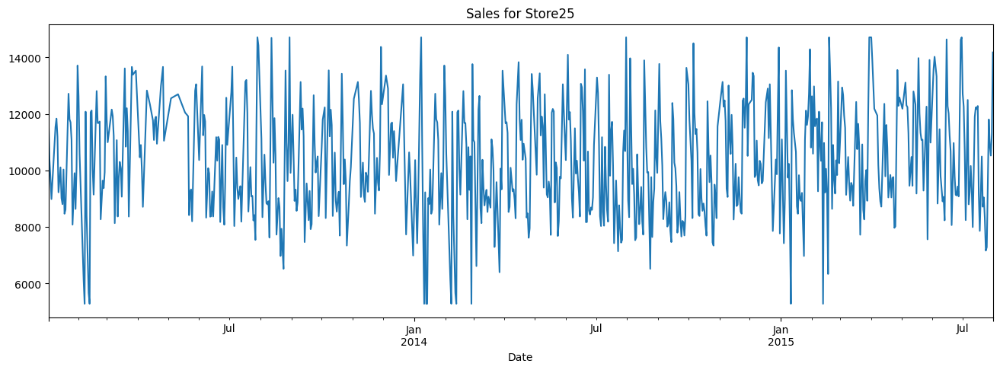

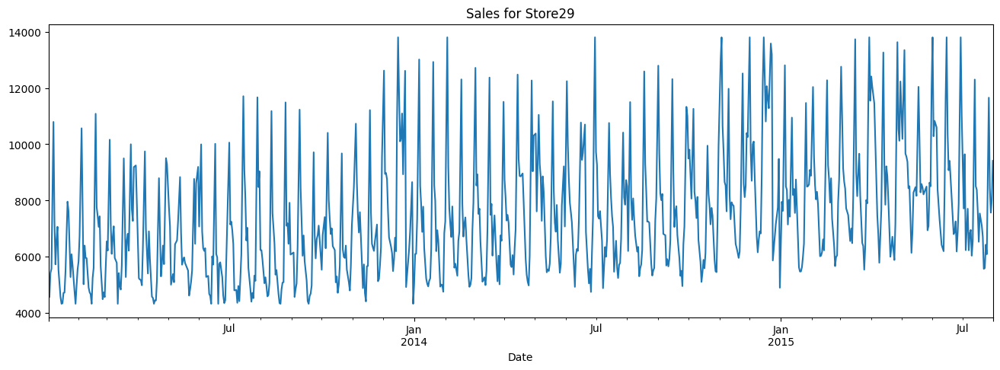

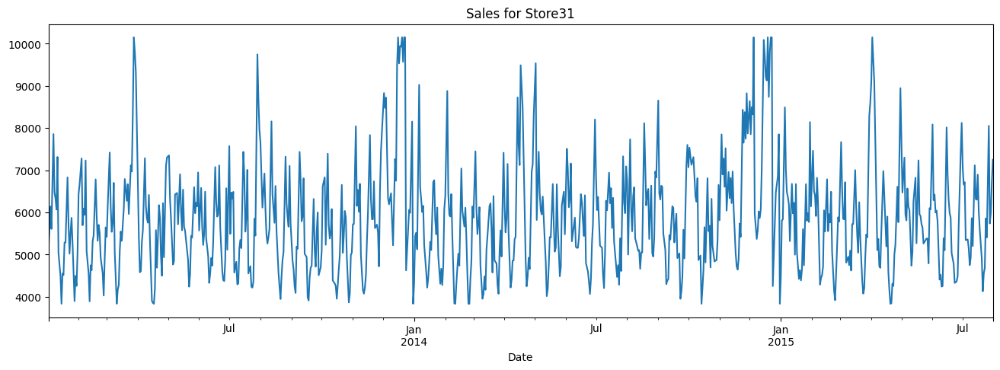

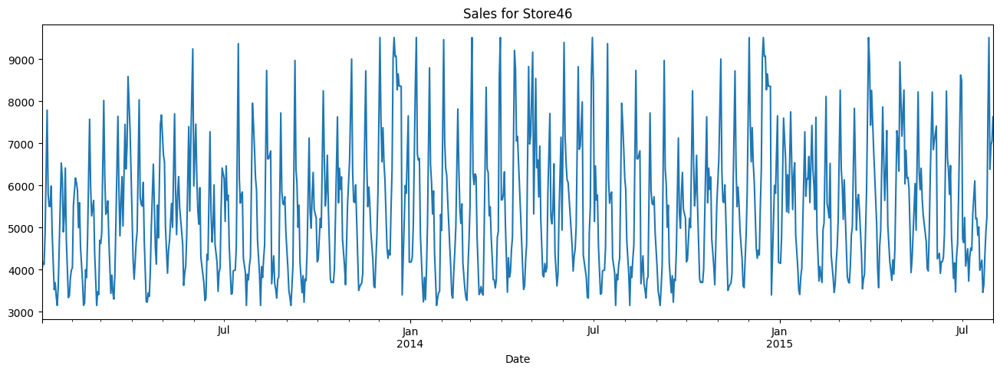

In [68]:
for store in Predict_stores:
    Store_Data[store]['Sales'].astype(float).plot(y='Sales',figsize = (16,5),)
    plt.title('Sales for Store'+str(store))

    plt.show(block=False)

### **Checking Stationarity**

In [69]:
Non_Stationary_Sales=[]

def Stationarity_Check_Sales(data,store,signif=0.05):

    ad = adfuller(data['Sales'], autolag='AIC')
    output = {'test_statistic':round(ad[0], 4), 'pvalue':round(ad[1], 4), 'n_lags':round(ad[2], 4), 'n_obs':ad[3]}
    p_value = output['pvalue']
    def adj(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m Augmented Dickey-Fuller Test on Sales for Store:' , store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in ad[4].items():
        print(f' Critical value {adj(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        Non_Stationary_Sales.append(store)

    print('\n')

In [70]:
Non_Stationary_Customers=[]
def Stationarity_Check_Customers(data,store,signif=0.05):

    ad = adfuller(data['Customers'], autolag='AIC')
    output = {'test_statistic':round(ad[0], 4), 'pvalue':round(ad[1], 4), 'n_lags':round(ad[2], 4), 'n_obs':ad[3]}
    p_value = output['pvalue']
    def adj(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m Augmented Dickey-Fuller Test on Customers for Store:', store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in ad[4].items():
        print(f' Critical value {adj(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        Non_Stationary_Customers.append(store)

    print('\n')

In [71]:
Non_Stationary_Sales_Per_Customers=[]
def Stationarity_Check_Sales_Per_Customer(data,store,signif=0.05):

    ad = adfuller(data['Sales/Customer'], autolag='AIC')
    output = {'test_statistic':round(ad[0], 4), 'pvalue':round(ad[1], 4), 'n_lags':round(ad[2], 4), 'n_obs':ad[3]}
    p_value = output['pvalue']
    def adj(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m Augmented Dickey-Fuller Test on Sales/Customer for Store:',store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in ad[4].items():
        print(f' Critical value {adj(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        Non_Stationary_Sales_Per_Customers.append(store)

    print('\n')

## Calculating the Sales Stationarity check using Augmented Dickey-Fuller Test for each store

In [72]:

for store in Predict_stores:
    Stationarity_Check_Sales(Store_Data[store],store)

 Augmented Dickey-Fuller Test on Sales for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.2494
 No. Lags Chosen       = 17
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Sales for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8052
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Sales for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.3823
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865

In [73]:
# Customers Stationarity check
for store in Predict_stores:
    Stationarity_Check_Customers(Store_Data[store],store)



 Augmented Dickey-Fuller Test on Customers for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.025
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0013. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.5075
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.1673
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5

In [75]:
print('NonStationarySales:',Non_Stationary_Sales)
print('NonStationaryCustomers:',Non_Stationary_Customers)

NonStationarySales: []
NonStationaryCustomers: []


In [76]:
# Checking decomposition of our series
def plot_timeseries_data(data,store):
    print('\033[1m  Decomposition for Store:',store, '\033[0m ')

    rcParams['figure.figsize'] = 18,8
    decom = sm.tsa.seasonal_decompose(data['Sales'], model = "additive")
    decom.plot()

    plt.show(block=False)
    # fig.show()
    print('\n')
    print('\n')

## Calculating the Timeseries, Trend, Season and Resid for Sales data for each of the Critical Store

  Decomposition for Store: 1  


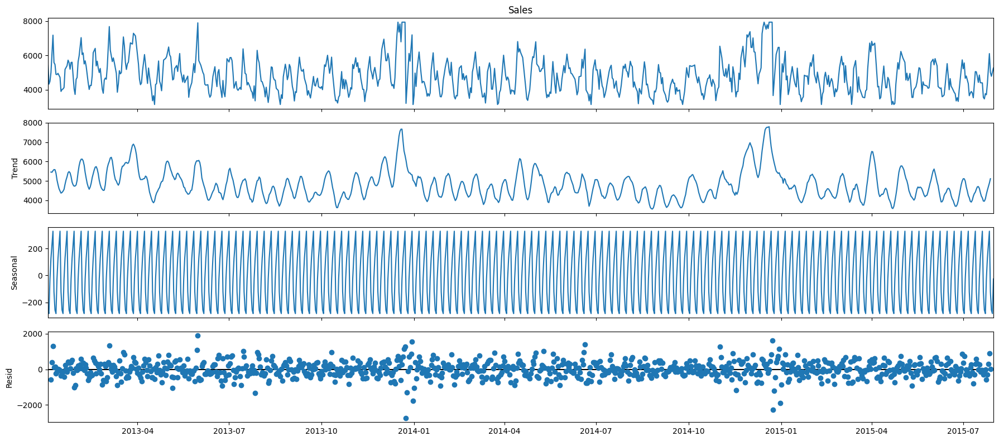





  Decomposition for Store: 3  


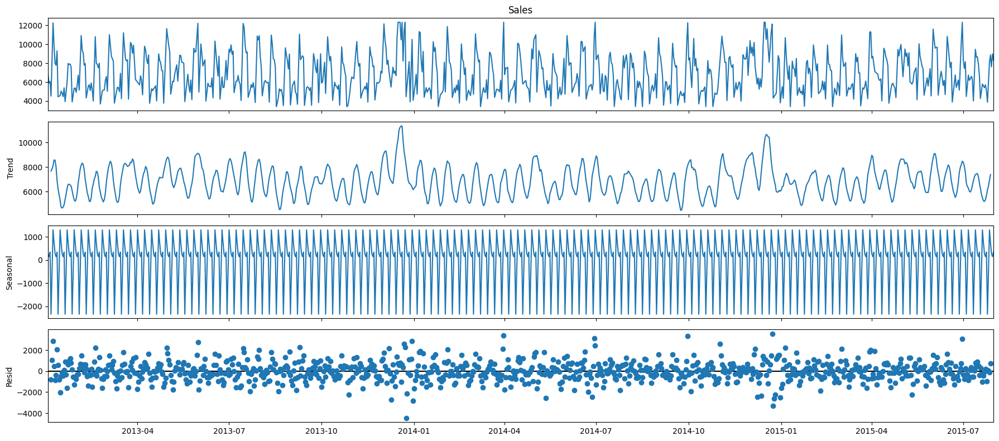





  Decomposition for Store: 8  


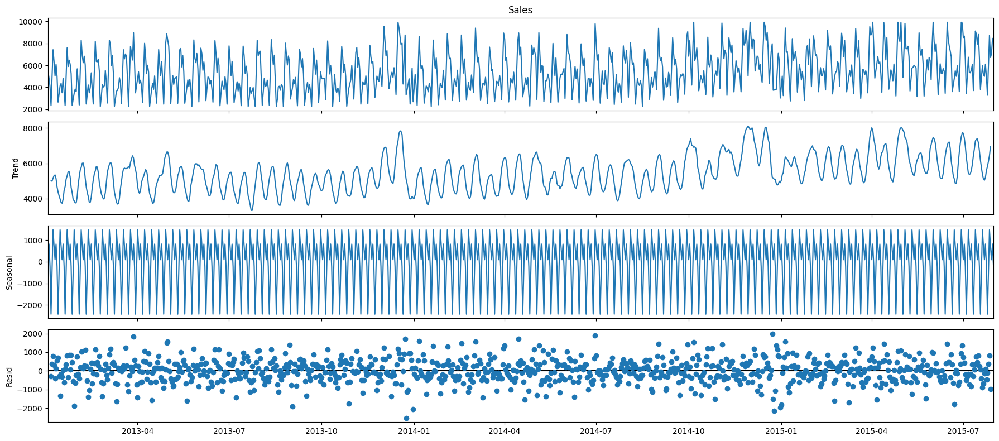





  Decomposition for Store: 9  


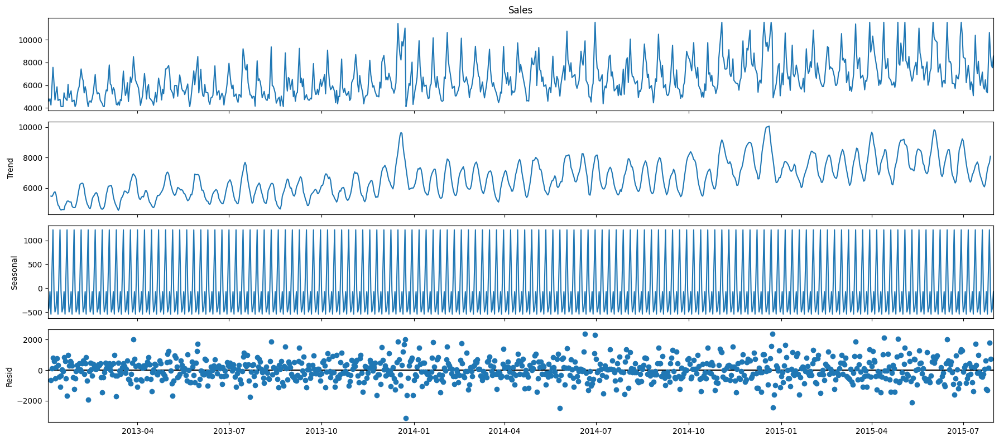





  Decomposition for Store: 13  


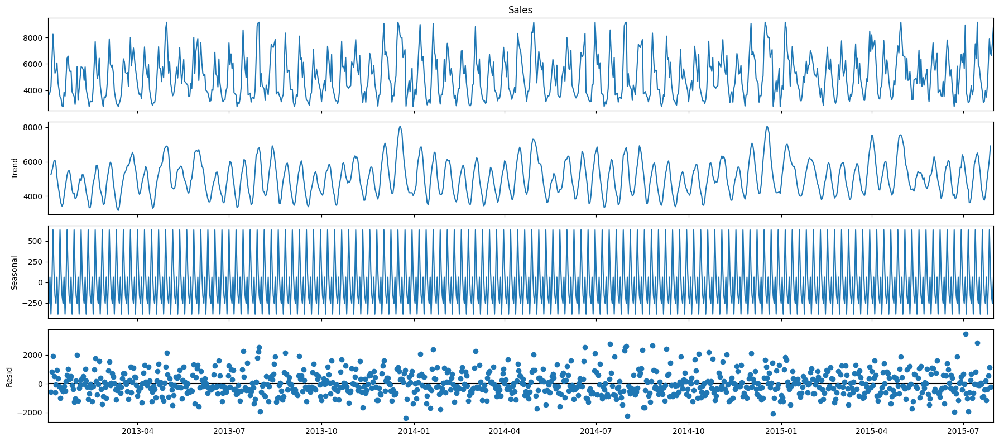





  Decomposition for Store: 25  


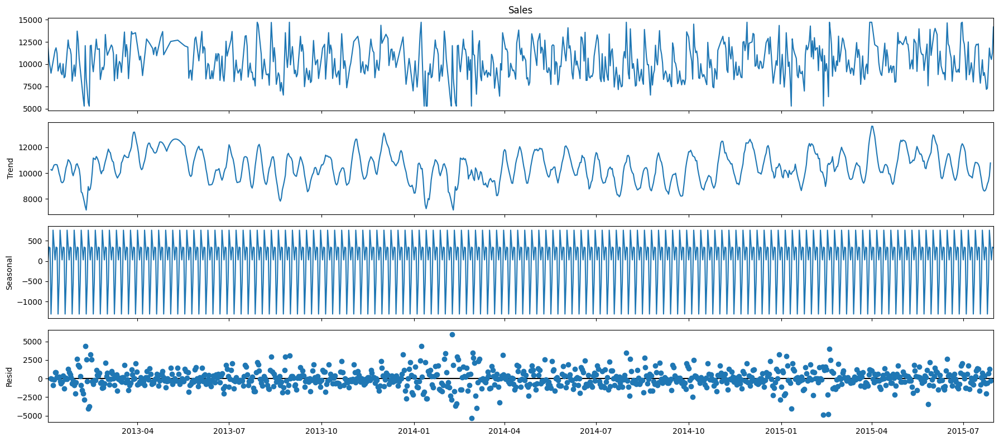





  Decomposition for Store: 29  


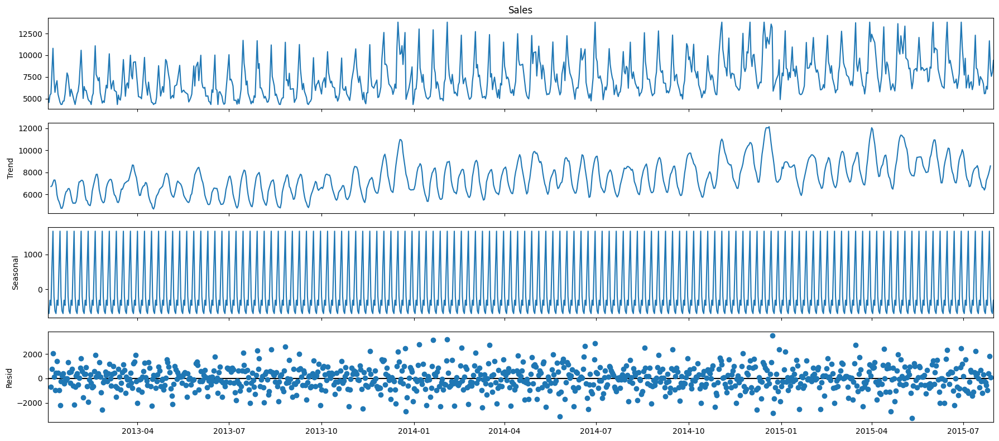





  Decomposition for Store: 31  


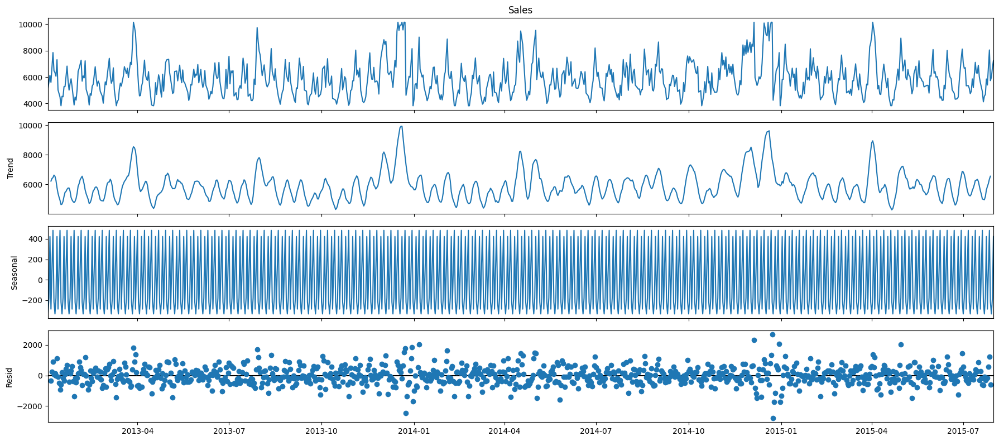





  Decomposition for Store: 46  


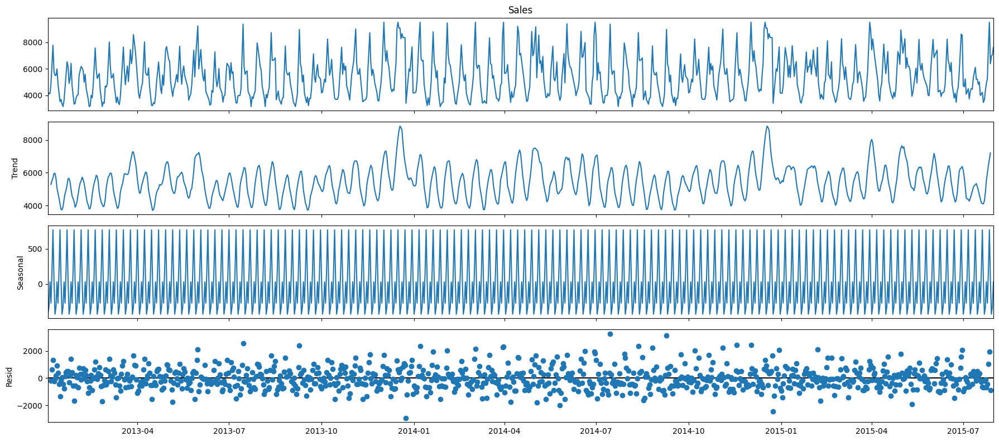

In [77]:
for store in Store_Data:
  plot_timeseries_data(Store_Data[store],store)

#### Observation
* Across the distribution for all the stores, we can observe there is Trend
* But there is not seasonality found

There is slight trend in Store 9 and 29. We can tune the trend parameter in our model.


### **Johansen test and causality between variables using Grangers Causality test**

Johansen's test is a procedure for testing cointegration among several time series. the Johansen test allows for multiple cointegrating relationships and is based on a vector autoregressive (VAR) framework. It provides both the number of cointegrating vectors and the vectors themselves.

In [78]:
def johansen_output(residual,store):
    print("\033[1m Johansen Test for Store: ",store,' \033[0m')
    output = pd.DataFrame([residual.lr2,residual.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",residual.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",residual.cvt,'\n')
    print('\n')

In [79]:
for store in Store_Data:
  joh_model1 = coint_johansen(Store_Data[store][['Sales','Customers']],0,15) # k_ar_diff +1 = K
  johansen_output(joh_model1,store)

 Johansen Test for Store:  1  
   max_eig_stat  trace_stat
0     49.966868   58.888727
1      8.921860    8.921860 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  3  
   max_eig_stat  trace_stat
0     62.452855   88.102653
1     25.649798   25.649798 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  8  
   max_eig_stat  trace_stat
0     42.097072   58.960007
1     16.862935   16.862935 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for 

### Store-Specific Conclusions:

* Store 1: Indicates at least one cointegrating relationship, as the first max_eig_stat and trace_stat exceed their critical values. The second test suggests no additional cointegrating relationship beyond the first.

* Store 3: Strong evidence of at least two cointegrating relationships, with both tests exceeding critical values for the first and second cointegrating equations.

* Store 8: Suggests at least one cointegrating relationship. The second max_eig_stat also suggests a possible second cointegrating relationship.

* Store 9: Indicates at least one cointegrating relationship. The second test's results are borderline, suggesting a potential second relationship, but this is less clear.

* Store 13: Evidence of at least one cointegrating relationship, with a possible second one indicated by the second max_eig_stat and trace_stat.

* Store 25: Similar to Store 13, indicating at least one cointegrating relationship, with a potential second one suggested by the second tests.

* Store 29: Indicates at least one cointegrating relationship. The second test's results are close to the critical values, suggesting a potential second relationship but with less certainty.

* Store 31: Shows evidence of at least one cointegrating relationship, with the second tests suggesting a possible second relationship.

* Store 46: Strong evidence of at least two cointegrating relationships, as both the max_eig_stat and trace_stat for the first and second tests exceed their critical values.

In [80]:
# Grangers Causality Test
# importing required library
from statsmodels.tsa.stattools import grangercausalitytests

max_lag=30
test = 'ssr_chi2test'

def grangers_causation_test_matrix(data, variables,store, test='ssr_chi2test', verbose=False):
    print("\033[1m Grangers Causality Test for Store: ",store,'\033[0m')

    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for x in df.columns:
        for y in df.index:
            test_result = grangercausalitytests(data[[x, y]], maxlag=max_lag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(max_lag)]
            if verbose: print(f'Y = {y}, X = {x}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[y, x] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    print(df)
    print('\n')

In [81]:
for store in Store_Data:
  grangers_causation_test_matrix(Store_Data[store], variables = Store_Data[store][['Customers','Sales']].columns,store=store)

 Grangers Causality Test for Store:  1 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  3 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  8 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  9 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  13 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  25 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0      1.0


 Grangers Causality Test for Store:  29 
             Customers_x  Sales_x
Customers_y          1.0      0.0
Sales_y              0.0 

### **Split data into  Train-Test**

In [82]:
# Creating Train-Test Split
# Starting test from test.index.max - 6 weeks

Train_Test_Data={}

for store in Predict_stores:
    startDate=Store_Data[store].index.min().strftime("%Y-%m-%d")
    trainRange=Store_Data[store].index.max()-relativedelta(weeks=6)
    testStart=trainRange+relativedelta(days=1)
    trainRange=trainRange.strftime("%Y-%m-%d")
    testStart=testStart.strftime("%Y-%m-%d")

    Train_Test_Data[store]={}
    Train_Test_Data[store]['train']=Store_Data[store][startDate:trainRange]
    Train_Test_Data[store]['test']=Store_Data[store][testStart:]

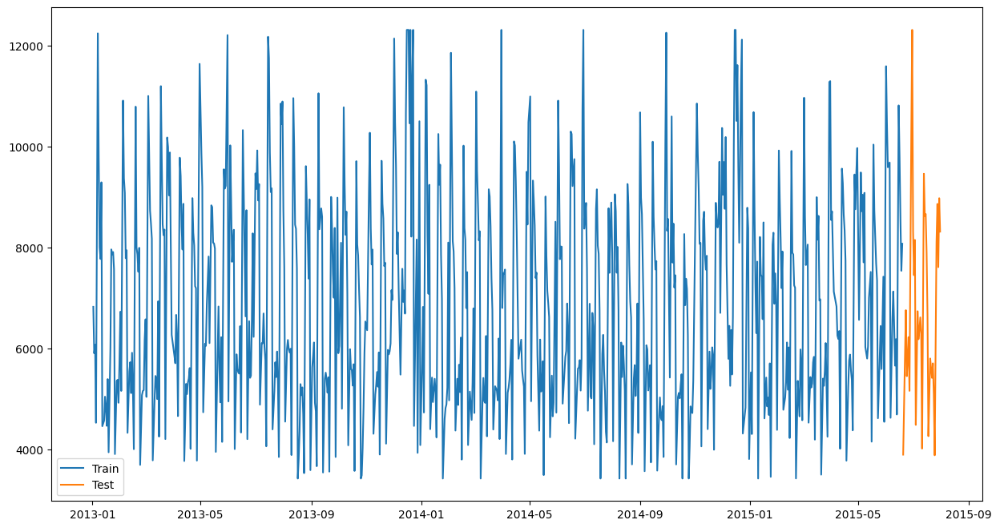

In [83]:
# checking train test split for one store
plt.figure(figsize=(15,8))
plt.plot(Train_Test_Data[3]['train']['Sales'], label='Train')
plt.plot(Train_Test_Data[3]['test']['Sales'], label='Test')
plt.legend(loc='best')
plt.show()

In [84]:
Train_Test_Data[3]['train'].tail()

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2015-06-15,3.0,0,10818.0,955.0,1.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,15
2015-06-16,3.0,1,9780.0,911.0,1.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,16
2015-06-17,3.0,2,8524.0,821.0,1.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,17
2015-06-18,3.0,3,7537.0,743.0,1.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,18
2015-06-19,3.0,4,8074.0,797.0,1.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,19


In [85]:
Train_Test_Data[3]['test'].head(3)


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2015-06-20,3.0,5,3891.0,424.0,0.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,20
2015-06-21,3.0,6,4865.5,531.0,0.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,21
2015-06-22,3.0,0,5840.0,638.0,0.0,0,0.0,a,a,14130.0,12.0,2006.0,1.0,14.0,2011.0,2015,6,22


### **Scaling**

In [86]:
# Scaled Sales/Customer in our model is actually  degarding performance
# So will not scale Sales/Customer as we want to use this scaler to inverse transform later
# importing required library

from sklearn.preprocessing import StandardScaler

scalers={}
multivariate_Col=['Sales','Customers']

for store in Store_Data:
  scalers[store]= StandardScaler()
  scalers[store].fit(Train_Test_Data[store]['train'][multivariate_Col])
  Train_Test_Data[store]['train'][multivariate_Col] = scalers[store].transform(Train_Test_Data[store]['train'][multivariate_Col])
  Train_Test_Data[store]['test'][multivariate_Col] = scalers[store].transform(Train_Test_Data[store]['test'][multivariate_Col])


In [87]:
Train_Test_Data[1]['train'].tail()

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2015-06-15,1.0,0,0.700961,0.157155,1.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,15
2015-06-16,1.0,1,0.021832,-0.772379,1.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,16
2015-06-17,1.0,2,-0.846963,-1.074758,1.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,17
2015-06-18,1.0,3,-0.189249,-0.828375,1.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,18
2015-06-19,1.0,4,-0.640981,-0.951567,1.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,19


In [88]:
Train_Test_Data[1]['test'].head()

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day
Date,,,,,,,,,,,,,,,,,,
2015-06-20,1.0,5,-0.748051,-0.873172,0.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,20
2015-06-21,1.0,6,-0.876025,-0.901170,0.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,21
2015-06-22,1.0,0,-1.003999,-0.929168,0.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,22
2015-06-23,1.0,1,-1.089655,-1.399535,0.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,23
2015-06-24,1.0,2,-1.513856,-1.719832,0.0,0,0.0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.0,2015,6,24


## Plotting of Sales data Train vs Test after data split up

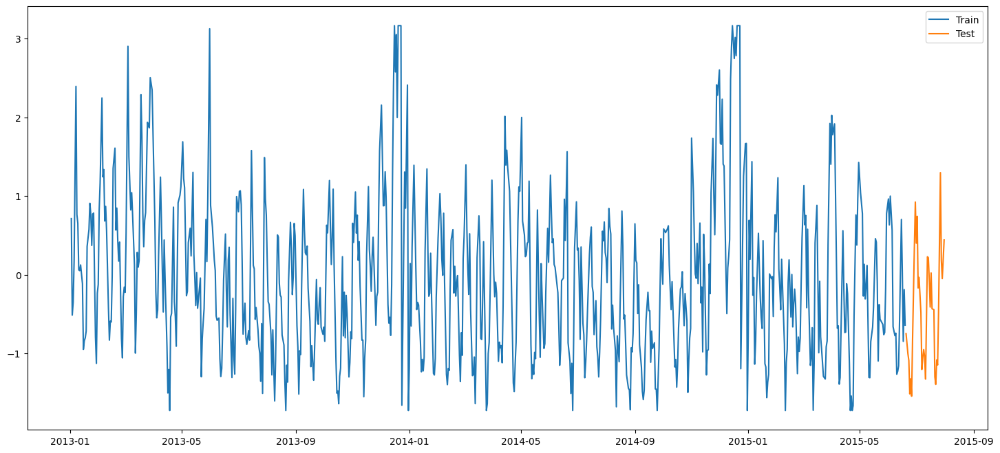

In [89]:
plt.plot(Train_Test_Data[1]['train']['Sales'], label='Train')
plt.plot(Train_Test_Data[1]['test']['Sales'], label='Test')
plt.legend(loc='best')
plt.show()

In [90]:
# checking if there is uniqueness in SchoolHoliday and StateHoliday
for store in Store_Data:
  unique_State_Holiday=Store_Data[store]['StateHoliday'].unique()
  unique_School_Holiday=Store_Data[store]['SchoolHoliday'].unique()
  print('unique StateHoliday Values for Store',store,": ",len(unique_State_Holiday))
  print('unique SchoolHoliday Values for Store ',store,': ',len(unique_State_Holiday))
  print('\n')

unique StateHoliday Values for Store 1 :  1
unique SchoolHoliday Values for Store  1 :  1


unique StateHoliday Values for Store 3 :  1
unique SchoolHoliday Values for Store  3 :  1


unique StateHoliday Values for Store 8 :  1
unique SchoolHoliday Values for Store  8 :  1


unique StateHoliday Values for Store 9 :  1
unique SchoolHoliday Values for Store  9 :  1


unique StateHoliday Values for Store 13 :  1
unique SchoolHoliday Values for Store  13 :  1


unique StateHoliday Values for Store 25 :  1
unique SchoolHoliday Values for Store  25 :  1


unique StateHoliday Values for Store 29 :  1
unique SchoolHoliday Values for Store  29 :  1


unique StateHoliday Values for Store 31 :  1
unique SchoolHoliday Values for Store  31 :  1


unique StateHoliday Values for Store 46 :  1
unique SchoolHoliday Values for Store  46 :  1




- StateHoliday has only 1 value hence we will use only SchoolHoliday for prediction

### **Model**

The ACF-PACF model isn't a model itself, but rather a methodology used to identify and build appropriate time series models like ARIMA (AutoRegressive Integrated Moving Average). It relies on two key plots

- **Autocorrelation Function** (ACF): This plot shows the correlation of a time series with its own lagged values. In simpler terms, it measures how much a value at a particular time point is influenced by values at previous time points (lags). A significant spike at a particular lag suggests a strong correlation at that lag.

- **Partial Autocorrelation Function** (PACF): This plot is similar to ACF, but it measures the correlation between a time series and its lagged values after removing the influence of any correlations due to the intervening lags. This helps isolate the direct relationship between a value and its lag.

In [91]:
# Function to plot ACF-PACF

def Plot_Acf_Pacf(data,store):
  print('\033[1m PACF AND ACF for Store:', store, '\033[0m')
  lag_acf = acf(data['Sales'], nlags=30) # MA
  lag_pacf = pacf(data['Sales'], nlags=30, method='ols')  # AR
  plt.subplots(figsize=(19,9))

  #Plot PACF:

  plt.subplot(1,2,1)
  plt.plot(lag_pacf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.title('Partial Autocorrelation Function')

  #Plot ACF:

  plt.subplot(1,2,2)
  plt.plot(lag_acf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.title('Autocorrelation Function')

What is VARMAX?

VARMAX stands for Vector Autoregressive Moving Average with eXogenous regressors.  It's a statistical model used for analyzing and forecasting multiple time series that are related to each other.  Think of it as a supercharged version of the ARIMA model, which is designed for a single time series.

Imagine you're trying to predict the weather for the next few days.  You know that today's weather will likely influence tomorrow's, but other factors like the season or the presence of a storm system also play a role.  The VARMAX model is like a weather forecaster that takes all these factors into account.

Here's a simplified breakdown:

- **Multiple Variables** (Vector): Instead of just predicting temperature, the VARMAX model can predict multiple things at once, like temperature, humidity, and wind speed. These are all related, so predicting them together is more accurate.
- **Past Patterns** (Autoregression): The model looks at past weather patterns to see how they usually unfold. If it was sunny yesterday, there's a good chance it'll be sunny today too.
- **Random Shocks** (Moving Average): Sometimes unexpected things happen, like a sudden thunderstorm. The model takes these random events into account so they don't throw off the forecast too much.
- **External Factors** (Exogenous): The model can also consider other factors that affect the weather, like the time of year or whether a storm is approaching. This gives it even more information to make accurate predictions.

In [92]:
# Function for VARMAX model
def varMax_Model(data,p,q,exog,hasTrend='n',printStats=False):
  exog =data['train'][exog]
  mod = sm.tsa.VARMAX(data['train'][['Sales','Customers']], order=(p,q), trend=hasTrend, exog=exog)
  res = mod.fit(maxiter=1000, disp=False)
  if(printStats):
    print(res.summary())
  return (mod,res)

def predict_VarMax(data,store,mod,res,exog):
  start_idx = data['test'].index.min()
  end_idx = data['test'].index.max()
  exog=data['test'][exog]

  prediction = res.predict(start=start_idx, end=end_idx, exog=exog)
  Train_Test_Data[store]['predictions']=prediction

**What is SARIMAX?**

SARIMAX stands for Seasonal AutoRegressive Integrated Moving Average with eXogenous regressors.  It's a statistical model used for forecasting time series data that has both trends and seasonal patterns.

Imagine you're trying to predict the number of people visiting a beach each day. You know that more people go to the beach in the summer, but there might be other factors like weekends or holidays that also affect attendance. SARIMAX is like a smart beach attendance predictor that takes all these factors into account.
Key Components:

- **Seasonal** (S): This part of the model captures the repetitive patterns that occur at regular intervals (e.g., daily, weekly, or yearly). For example, ice cream sales might peak every summer.
- **AutoRegressive** (AR): This component considers the relationship between past and current values. For instance, today's temperature might be influenced by yesterday's temperature.
- **Integrated** (I): This refers to differencing, a technique used to make the data stationary (having a constant mean and variance over time), which is necessary for many forecasting models.
- **Moving Average** (MA): This part of the model considers the impact of past forecast errors. If the model consistently overpredicts, it might adjust its future predictions downward.
- **eXogenous** (X): This allows you to include external variables (factors that are not part of the time series itself) that might influence the data. For example, if you're forecasting electricity demand, you could include temperature as an exogenous variable.

In [93]:
# Function for SARIMAX model

from statsmodels.tsa.statespace.sarimax import SARIMAX

def sarimax_Model(data,exog,p=1,q=1,hasTrend='n',printStats=False):

  p,q=1,1
  if(runSarima):
    exog =data['train'][exog]
    mod = SARIMAX(data['train']['Sales'], order=(p, 1, q), seasonal_order=(1, 1, 1,7),exog=exog,trend=hasTrend)

    res = mod.fit()
    if(printStats):
      print(res.params)
    return mod,res

def predict_SariMax(data,store,mod,res,exogV):
  if(runSarima):
    start_idx = data['test'].index.min()
    end_idx = data['test'].index.max()

    prediction = res.predict(start_idx, end_idx,exog=data['test'][exogV])

    Train_Test_Data[store]['predictions']=prediction.to_frame(name='Sales')

In time series analysis, inverse_transform is a function used to reverse the scaling or transformation applied to the original data. Time series data often undergoes transformations for various reasons.

While these transformations can improve model performance, they also make the results difficult to interpret in the original scale.  inverse_transform comes in handy to bring the model's predictions or results back to the original units of the time series.

In [94]:
def inverse_Transform(data_frame,store):
  Train_Test_Data[store]['train'][multivariate_Col]=scalers[store].inverse_transform(data_frame['train'][multivariate_Col])
  Train_Test_Data[store]['test'][multivariate_Col]=scalers[store].inverse_transform(data_frame['test'][multivariate_Col])
  Train_Test_Data[store]['predictions'][multivariate_Col]=scalers[store].inverse_transform(data_frame['predictions'][multivariate_Col])

In [95]:
def plot_Prediction(data,store,res,model_name='VarMax'):
  plt.figure(figsize=(21,7))
  plt.plot(data['train']['Sales'], label='Train')
  plt.plot(data['test']['Sales'], label='Test')
  plt.plot(data['predictions']['Sales'], label='VAR')
  plt.legend(loc='best')
  plt.title(model_name+' Model - Sales '+ str(store))
  plt.show()
  if(model_name=='VarMax'):
    ax = res.impulse_responses(steps=25, orthogonalized=False).plot(figsize=(11,5))
    ax.set(xlabel='t', title='Responses to a shock to `Sales');
    plt.show()

In [96]:
model_Performance = pd.DataFrame(columns = ['Method', 'RMSE', 'MAPE'])

def get_Model_Metrics(data,store,model_name='VarMax'):
  global model_Performance
  rmse = np.sqrt(mean_squared_error(data['test']['Sales'], data['predictions']['Sales'])).round(2)
  mape = np.round(np.mean(np.abs(data['test']['Sales']-data['predictions']['Sales'])/data['test']['Sales'])*100,2)

  tempResults = pd.DataFrame({'Method':[str(model_name) +' for Store '+ str(store)], 'RMSE': [rmse],'MAPE': [mape] })
  # model_Performance=model_Performance.concat(tempResults)
  model_Performance = pd.concat([model_Performance, tempResults], ignore_index=True)
  return model_Performance

In [97]:
# Exogenous variable with lowest AIC for many stores
exog_variables=['Promo','SchoolHoliday','DayOfWeek','Day']
exog_variables

['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

### **Model Building**
Building model for each store

Selecting p,q values based on PACF & ACF graphs

 PACF AND ACF for Store: 1 


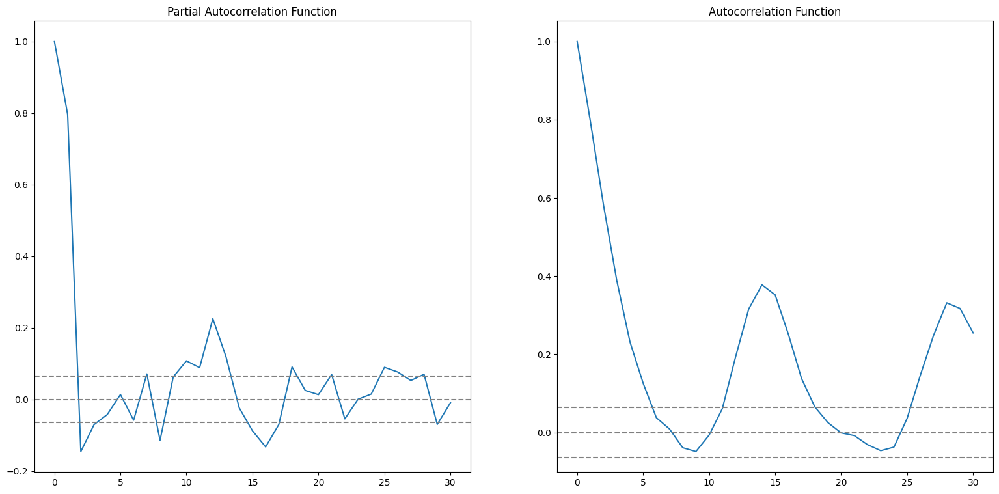

In [98]:
Plot_Acf_Pacf(Store_Data[1],1)

Absolutely! Let's break down this code snippet step by step. It seems to be focused on time series forecasting using a VARMAX model.

**1. `varMax_Model(Train_Test_Data[1], p=2, q=7, exog=exog_variables)`**

* **Function:** This line calls a function called `varMax_Model`.  Its purpose is to train a VARMAX (Vector Autoregressive Moving Average with eXogenous regressors) model.
* **Arguments:**
    * `Train_Test_Data[1]`: This likely refers to the training portion of your time series data.
    * `p=2`: Sets the order of the autoregressive (AR) component to 2. This means the model will consider the past 2 time steps for each variable when making predictions.
    * `q=7`: Sets the order of the moving average (MA) component to 7. This means the model will consider the past 7 forecast errors for each variable.
    * `exog=exog_variables`:  Includes exogenous variables (external factors that might influence the time series) in the model. `exog_variables` is a separate variable or dataset holding these values.
* **Output:**
    * `mod`: This is the trained VARMAX model object.
    * `res`:  This likely contains the model's results, such as fitted values or residuals.

**2. `predict_VarMax(Train_Test_Data[1], 1, mod, res, exog=exog_variables)`**

* **Function:**  This function `predict_VarMax` uses the trained model (`mod`) to generate forecasts.
* **Arguments:**
    * `Train_Test_Data[1]`: Again, this is likely the training data.
    * `1`: This could be the number of steps ahead to forecast (e.g., predict 1 period into the future).
    * `mod`: The trained VARMAX model.
    * `res`: The model's results from the previous step.
    * `exog=exog_variables`: If you're making forecasts into the future, you need to provide the values of the exogenous variables for those future periods as well.

**3. `inverse_Transform(Train_Test_Data[1], 1)`**

* **Function:** This function likely reverses any transformations (e.g., scaling, differencing) that were applied to the original time series data before modeling.
* **Arguments:**
    * `Train_Test_Data[1]`: The original training data.
    * `1`: This might be related to the number of steps used in the original transformation.

**4. `plot_Prediction(Train_Test_Data[1], 1, res)`**

* **Function:** This function visualizes the results. It probably plots the original time series data, the model's predictions, and potentially other information like confidence intervals.
* **Arguments:**
    * `Train_Test_Data[1]`: The original training data.
    * `1`: Might be related to the forecasting horizon used.
    * `res`: The model's results.

**Key Points and Potential Improvements:**

* **Model Order Selection:** The `p=2` and `q=7` values seem arbitrary. You might want to consider using techniques like information criteria (AIC, BIC) or grid search to find the optimal values for `p` and `q`.
* **Train-Test Split:** It's a good practice to split your data into a separate training set and test set. The test set is used to evaluate the model's performance on data it hasn't seen before.
* **Error Metrics:** Calculate error metrics (MAE, RMSE, etc.) on the test set to assess the model's accuracy.

Let me know if you'd like a more detailed explanation of any of these functions or concepts!


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

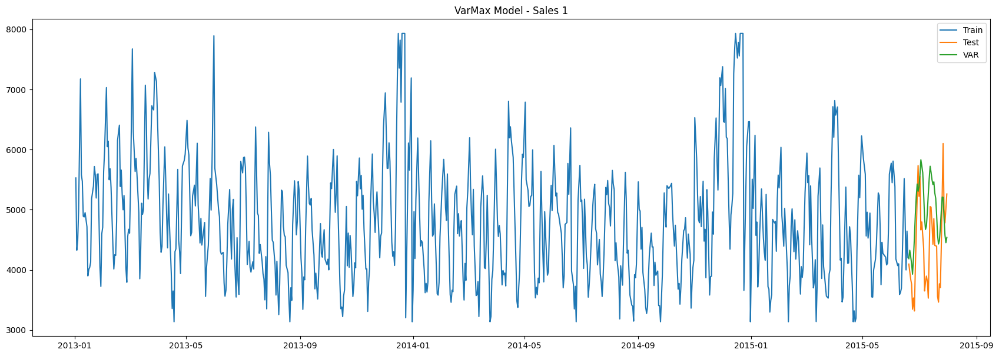

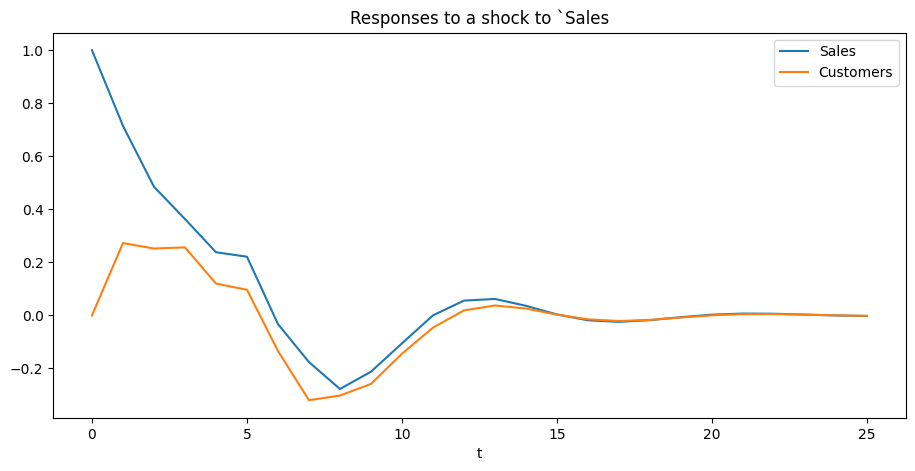

In [99]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[1],p=2,q=7,exog=exog_variables)
predict_VarMax(Train_Test_Data[1],1,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[1],1)
plot_Prediction(Train_Test_Data[1],1,res)

#### Observation
* The overlap of Test vs Var data is not much, whenever test sales goes lower , the pred valus goes above
* The response to a shock to sales is not great affected

In [100]:
get_Model_Metrics(Train_Test_Data[1],1)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.6,17.05


In [101]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[1],exog=exog_variables,p=2,q=7)

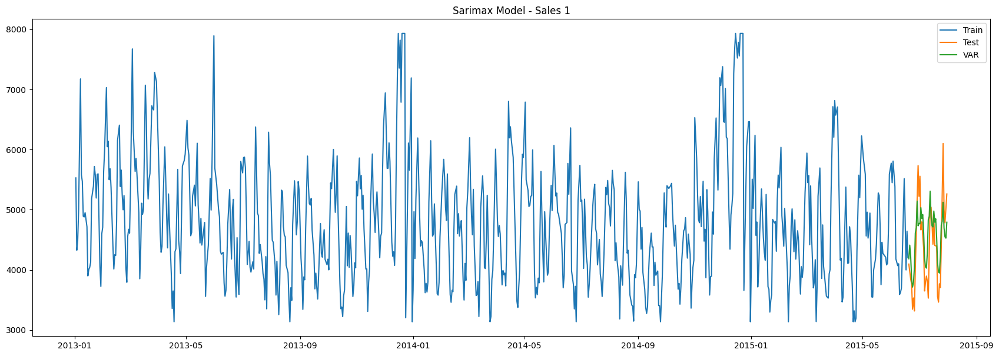

In [102]:
predict_SariMax(Train_Test_Data[1],1,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[1],1,res,'Sarimax')

In [103]:
get_Model_Metrics(Train_Test_Data[1],1,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.6,17.05
1,Sarimax for Store 1,477.6,9.20


 PACF AND ACF for Store: 3 


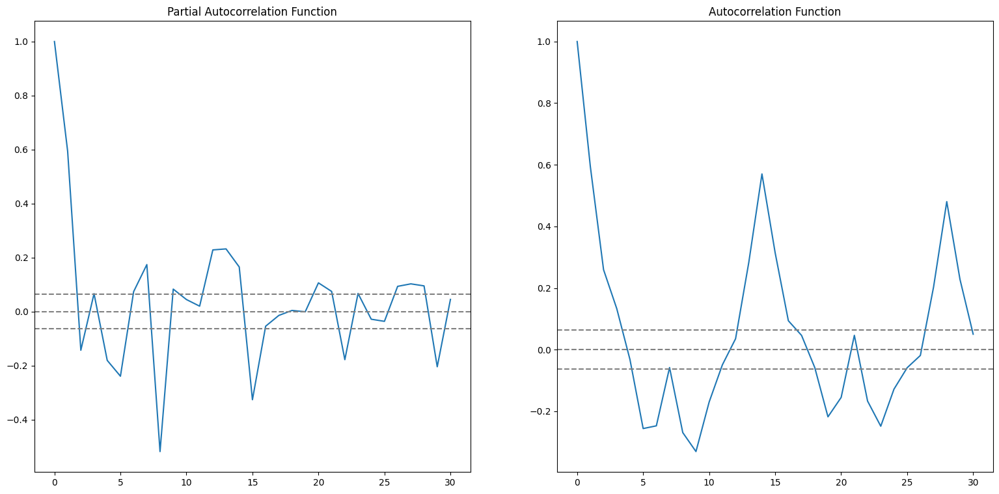

In [104]:
Plot_Acf_Pacf(Store_Data[3],3)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

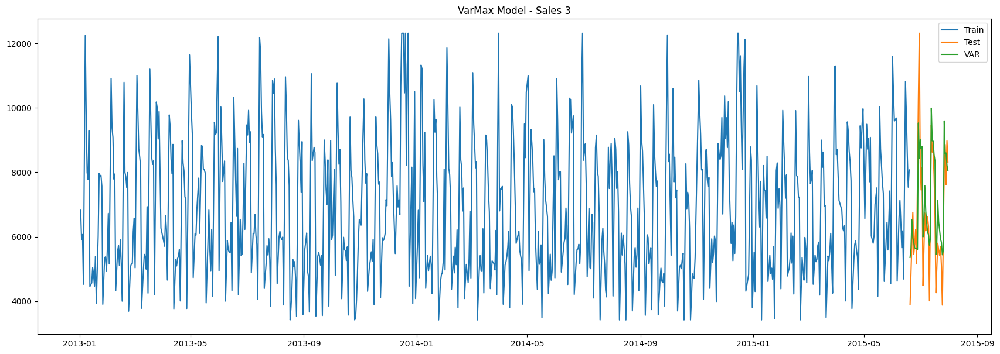

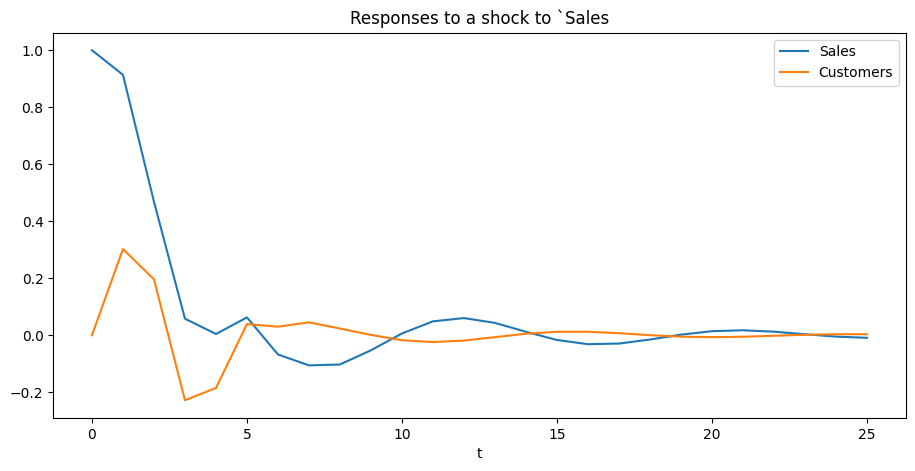

In [105]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[3],p=2,q=4,exog=exog_variables)
predict_VarMax(Train_Test_Data[3],3,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[3],3)
plot_Prediction(Train_Test_Data[3],3,res)

In [106]:
get_Model_Metrics(Train_Test_Data[3],3)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20


In [107]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[3],exog=exog_variables,p=2,q=4)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


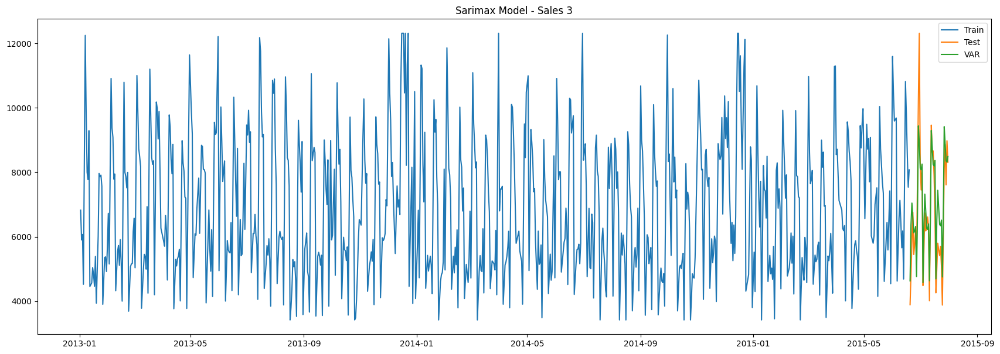

In [108]:
predict_SariMax(Train_Test_Data[3],3,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[3],3,res,'Sarimax')

In [109]:
get_Model_Metrics(Train_Test_Data[3],3,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45




```
# Calculating for Store 8
```



 PACF AND ACF for Store: 8 


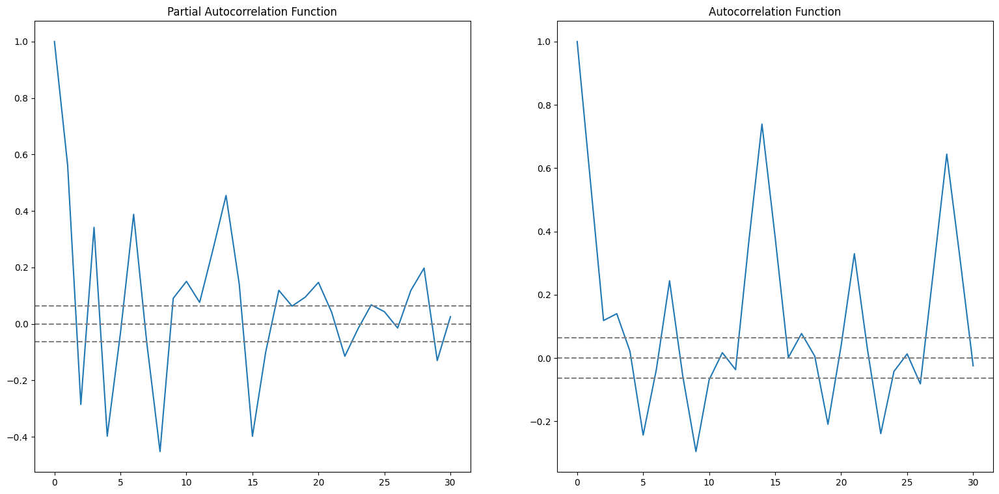

In [110]:
Plot_Acf_Pacf(Store_Data[8],8)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

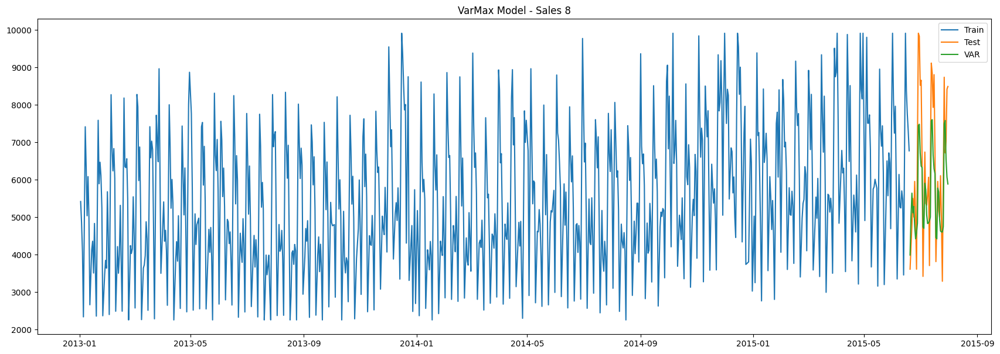

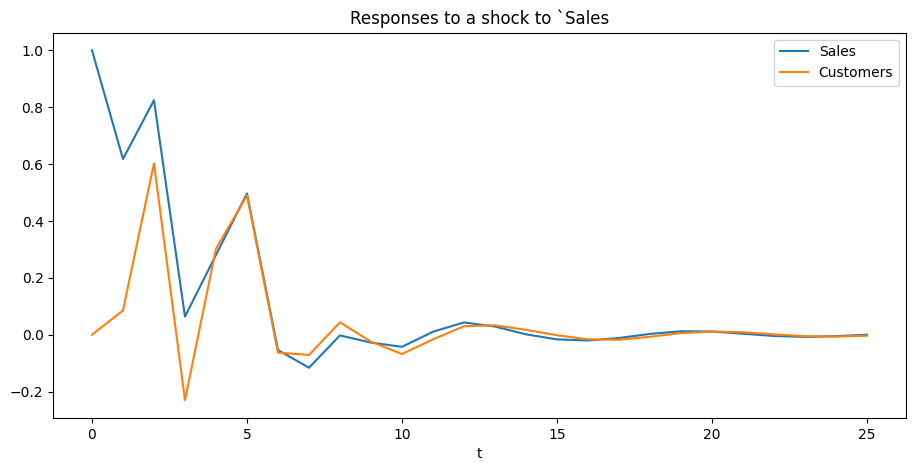

In [111]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[8],p=2,q=5,exog=exog_variables)
predict_VarMax(Train_Test_Data[8],8,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[8],8)
plot_Prediction(Train_Test_Data[8],8,res)

In [112]:
get_Model_Metrics(Train_Test_Data[8],8)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06


In [113]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[8],exog=exog_variables,p=2,q=5)

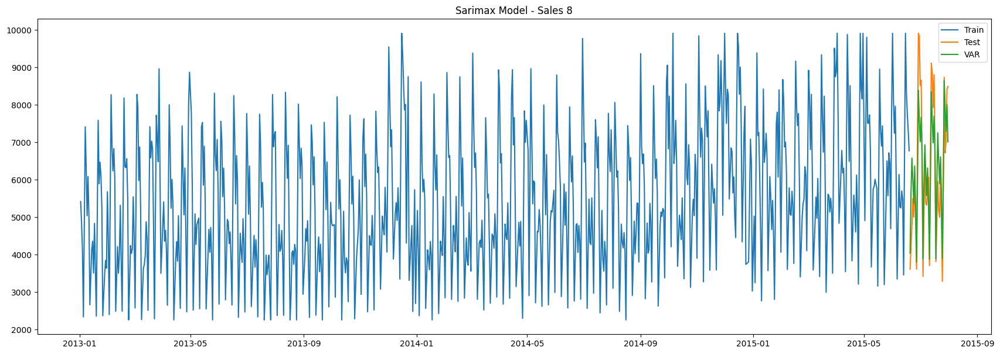

In [114]:
predict_SariMax(Train_Test_Data[8],8,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[8],8,res,'Sarimax')

In [115]:
get_Model_Metrics(Train_Test_Data[8],8,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29


9

 PACF AND ACF for Store: 9 


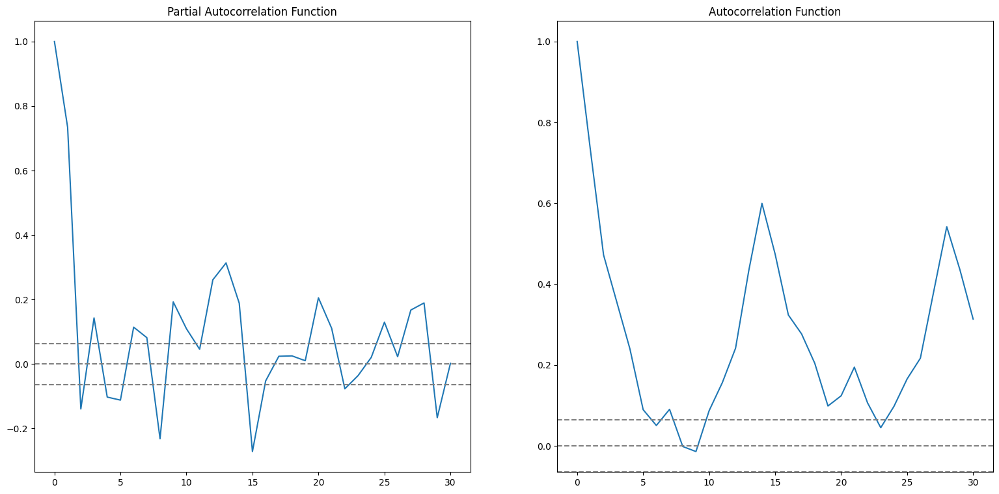

In [116]:
Plot_Acf_Pacf(Store_Data[9],9)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

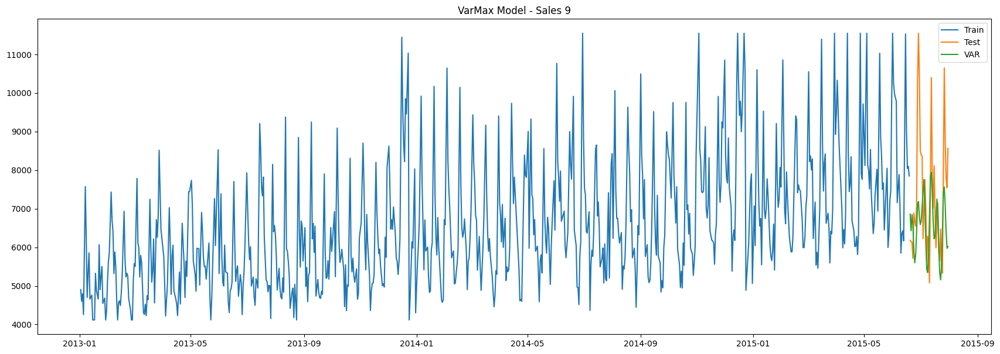

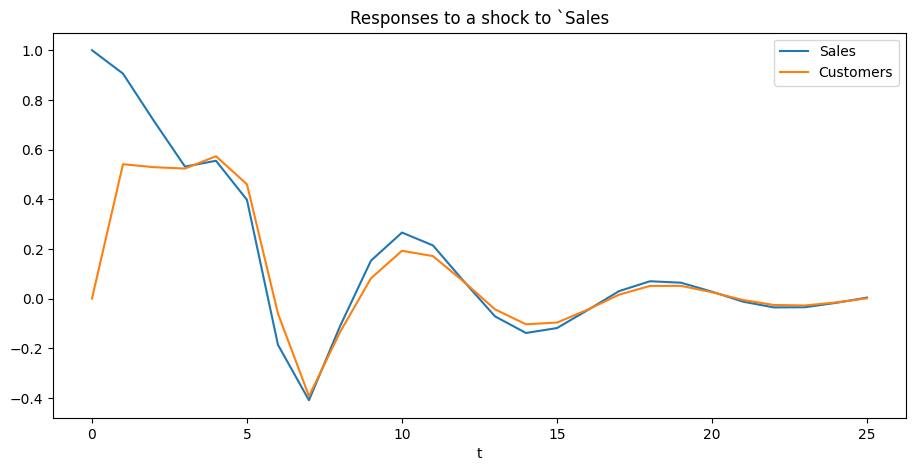

In [117]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[9],p=2,q=8,exog=exog_variables)
predict_VarMax(Train_Test_Data[9],9,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[9],9)
plot_Prediction(Train_Test_Data[9],9,res)

In [118]:
get_Model_Metrics(Train_Test_Data[9],9)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97


In [119]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[9],exog=exog_variables,p=2,q=8)

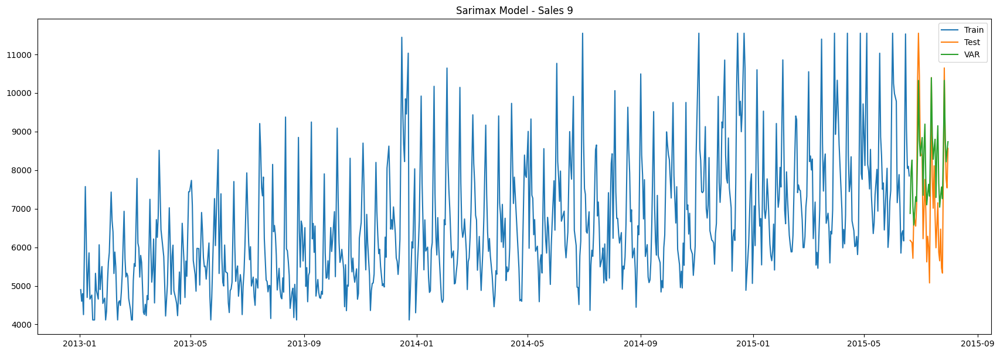

In [120]:
predict_SariMax(Train_Test_Data[9],9,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[9],9,res,'Sarimax')

In [121]:
get_Model_Metrics(Train_Test_Data[9],9,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44


13

 PACF AND ACF for Store: 13 


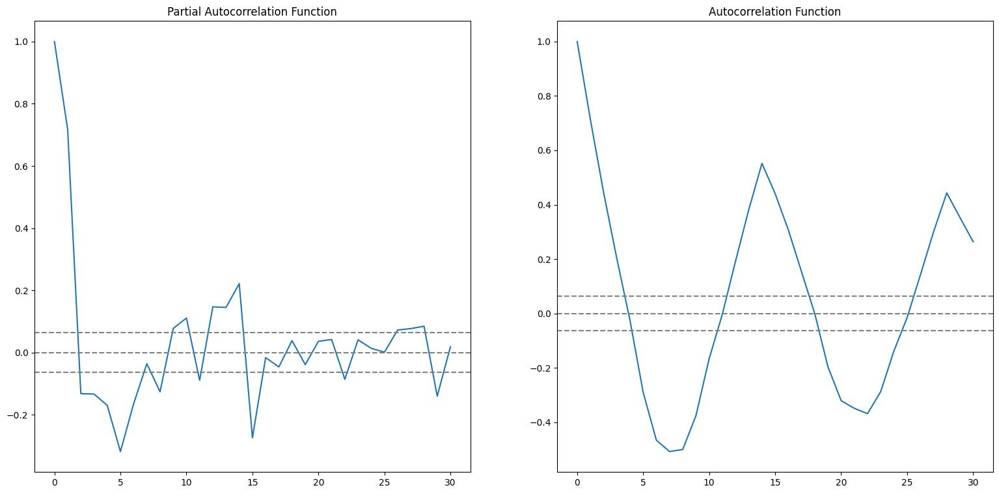

In [122]:
store_num=13
Plot_Acf_Pacf(Store_Data[store_num],store_num)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


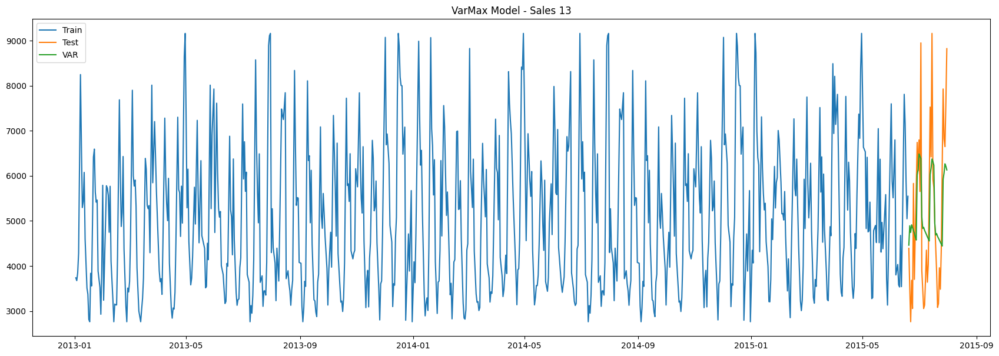

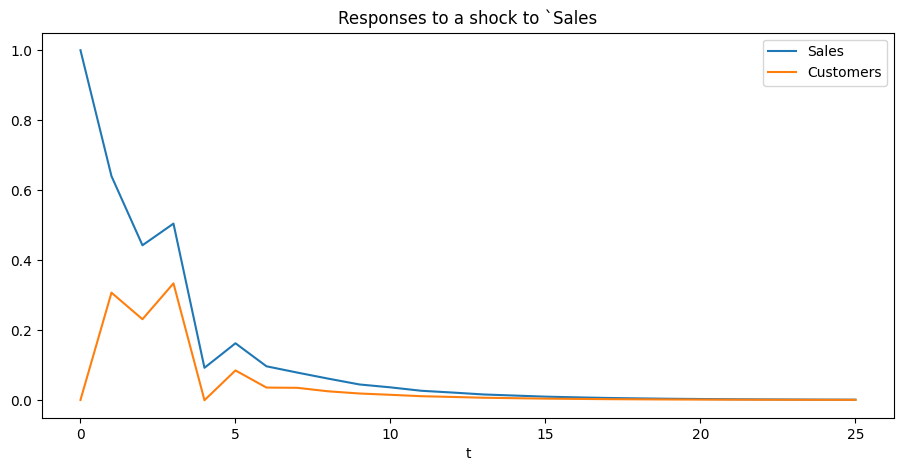

In [123]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[store_num],p=2,q=4,exog=exog_variables)
predict_VarMax(Train_Test_Data[store_num],store_num,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[store_num],store_num)
plot_Prediction(Train_Test_Data[store_num],store_num,res)

In [124]:
get_Model_Metrics(Train_Test_Data[store_num],store_num)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23


In [125]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[store_num],exog=exog_variables,p=2,q=4)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


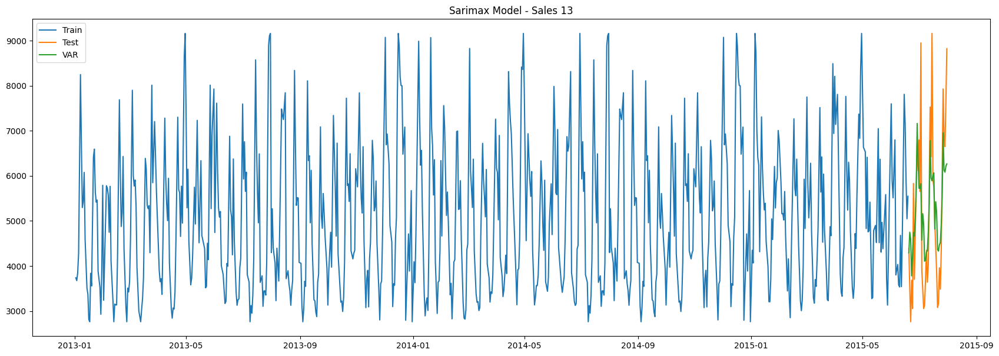

In [126]:
predict_SariMax(Train_Test_Data[store_num],store_num,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[store_num],store_num,res,'Sarimax')

In [127]:
get_Model_Metrics(Train_Test_Data[store_num],store_num,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


 PACF AND ACF for Store: 25 


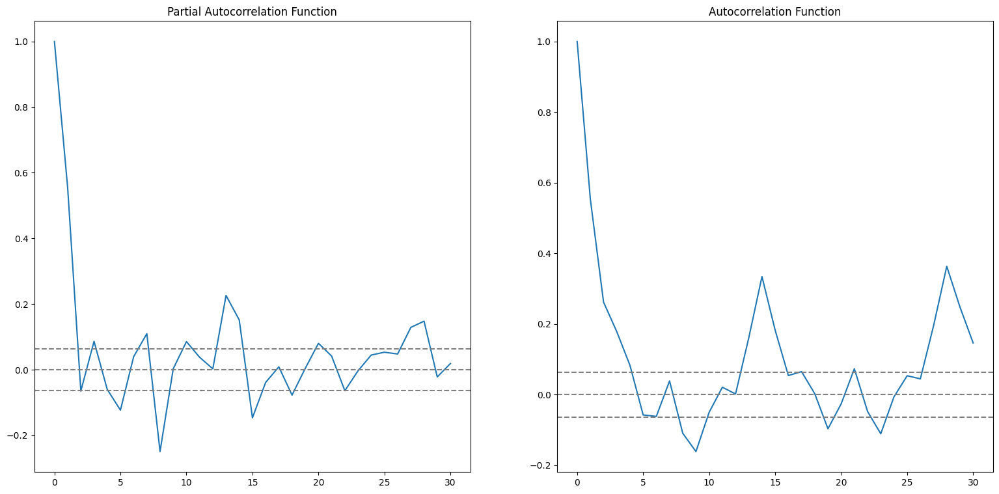

In [128]:
store_num= 25
Plot_Acf_Pacf(Store_Data[store_num],store_num)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

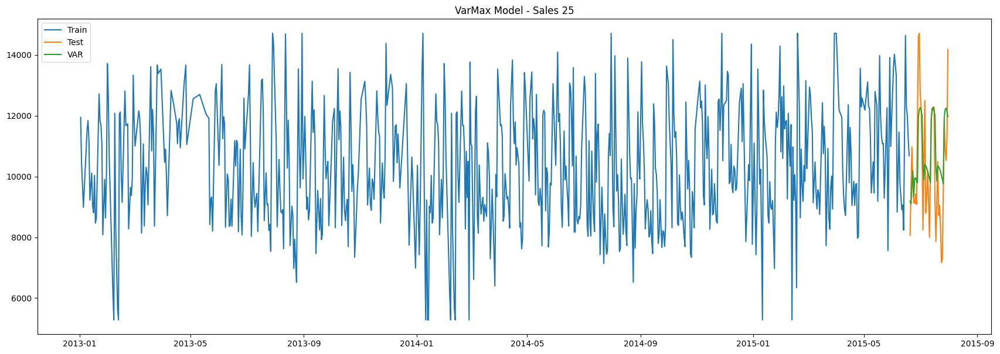

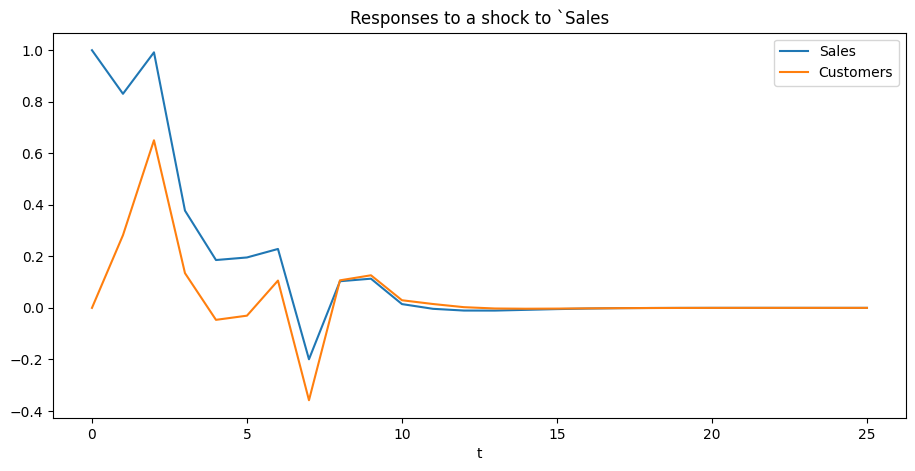

In [129]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[store_num],p=2,q=9,exog=exog_variables)
predict_VarMax(Train_Test_Data[store_num],store_num,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[store_num],store_num)
plot_Prediction(Train_Test_Data[store_num],store_num,res)

In [130]:
get_Model_Metrics(Train_Test_Data[store_num],store_num)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


In [131]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[store_num],exog=exog_variables,p=2,q=9)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


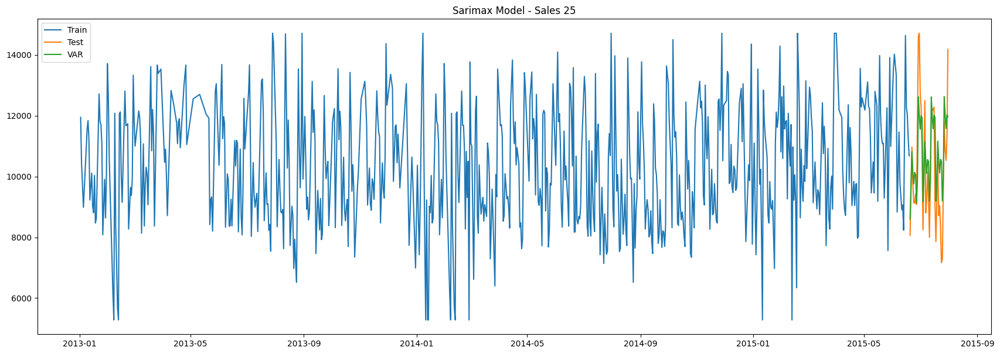

In [132]:
predict_SariMax(Train_Test_Data[store_num],store_num,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[store_num],store_num,res,'Sarimax')

In [133]:
get_Model_Metrics(Train_Test_Data[store_num],store_num,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


store_num =29

 PACF AND ACF for Store: 29 


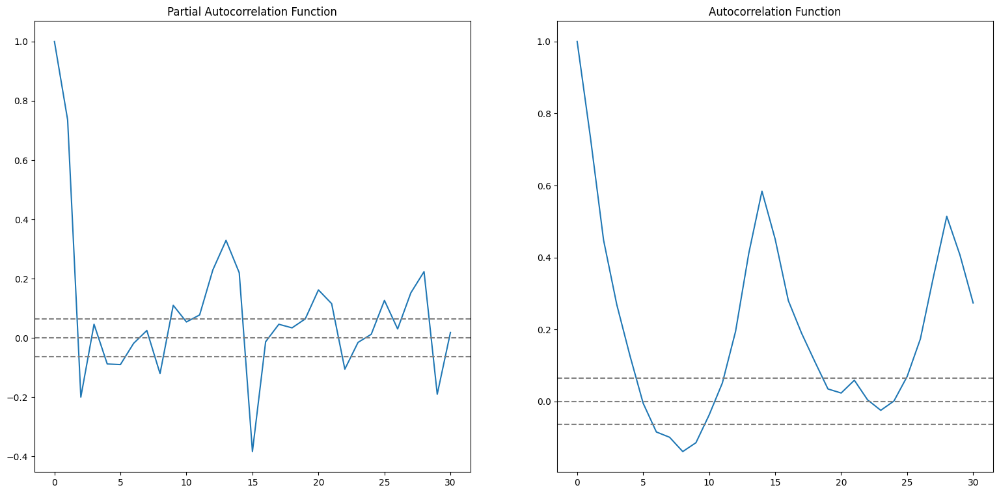

In [134]:
store_num = 29
Plot_Acf_Pacf(Store_Data[store_num],store_num)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

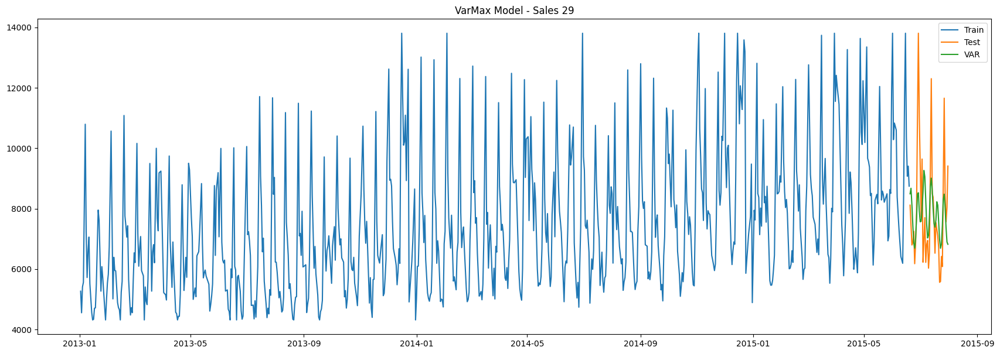

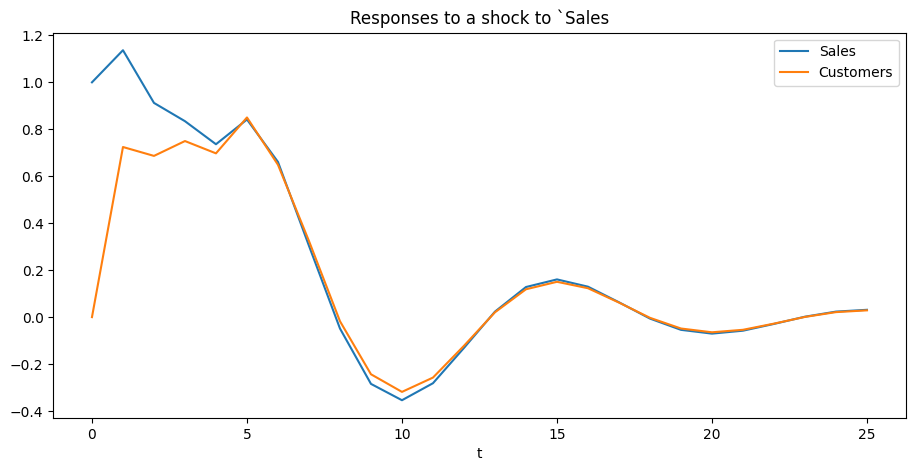

In [135]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[store_num],p=2,q=5,exog=exog_variables)
predict_VarMax(Train_Test_Data[store_num],store_num,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[store_num],store_num)
plot_Prediction(Train_Test_Data[store_num],store_num,res)

In [136]:
get_Model_Metrics(Train_Test_Data[store_num],store_num)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


In [137]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[store_num],exog=exog_variables,p=2,q=5)

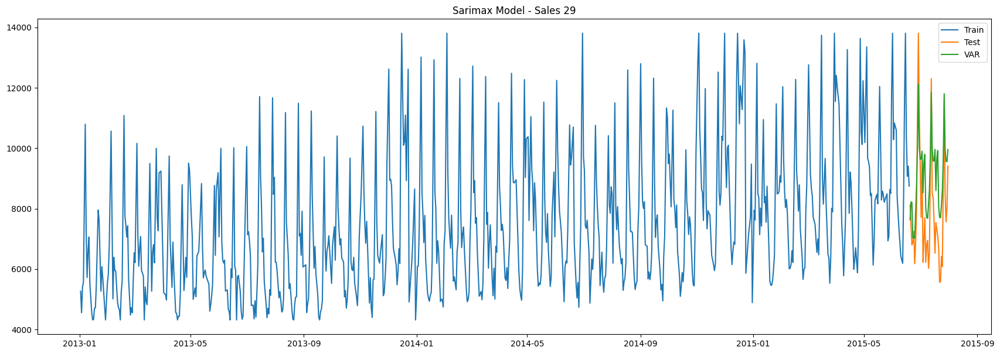

In [138]:
predict_SariMax(Train_Test_Data[store_num],store_num,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[store_num],store_num,res,'Sarimax')

In [139]:
get_Model_Metrics(Train_Test_Data[store_num],store_num,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


store_num =31

 PACF AND ACF for Store: 31 


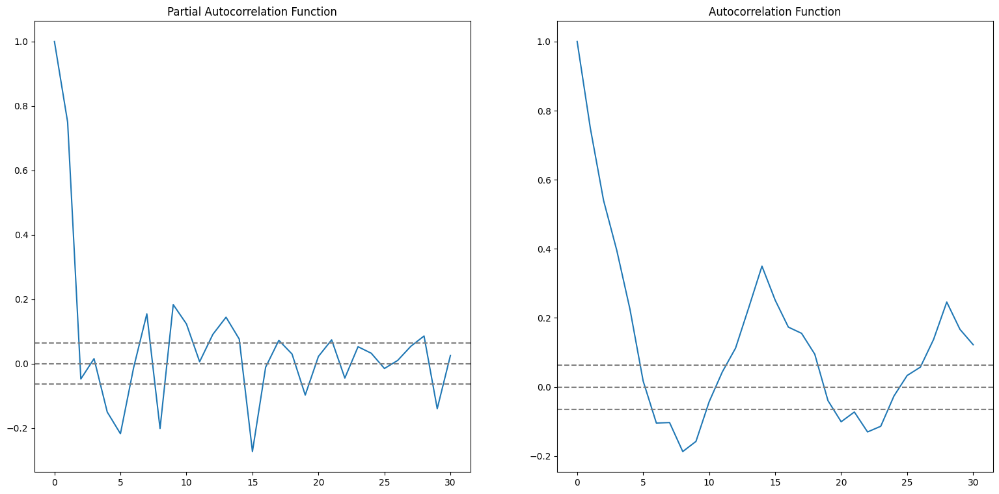

In [140]:
store_num = 31
Plot_Acf_Pacf(Store_Data[store_num],store_num)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models

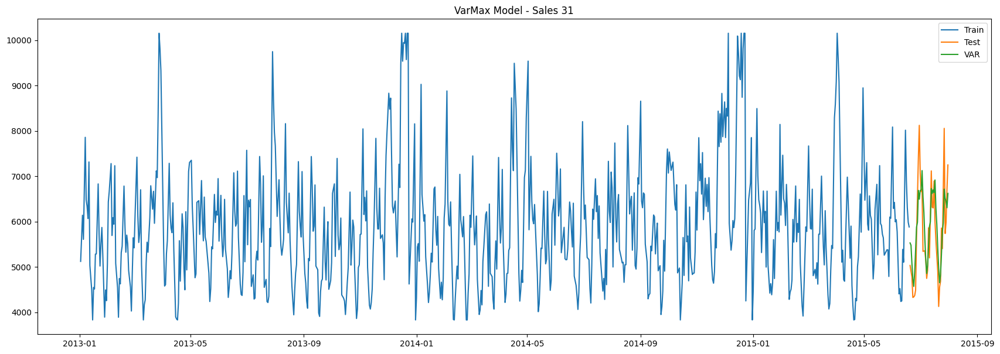

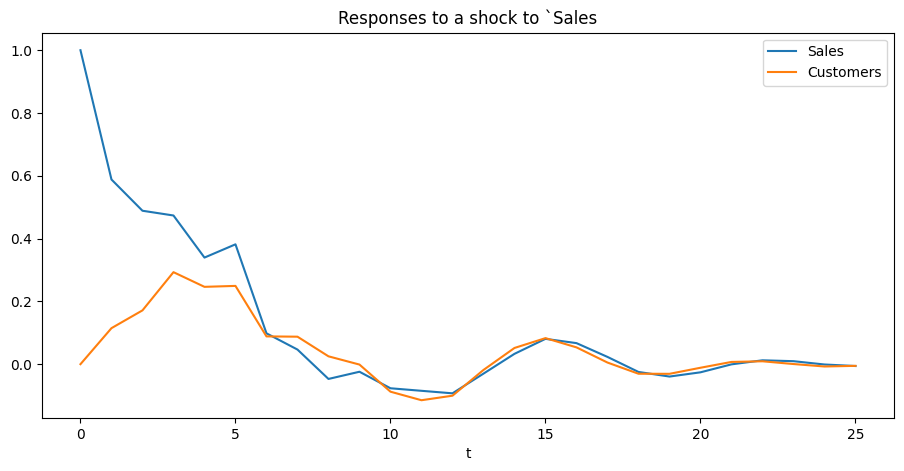

In [141]:
# Choosing p,q values bases on where the curve touches y=0 for first time

mod,res=varMax_Model(Train_Test_Data[store_num],p=3,q=5,exog=exog_variables)
predict_VarMax(Train_Test_Data[store_num],store_num,mod,res,exog=exog_variables)
inverse_Transform(Train_Test_Data[store_num],store_num)
plot_Prediction(Train_Test_Data[store_num],store_num,res)

In [142]:
get_Model_Metrics(Train_Test_Data[store_num],store_num)


,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


In [143]:
# SARIMAX
mod,res=sarimax_Model(Train_Test_Data[store_num],exog=exog_variables,p=3,q=5)

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


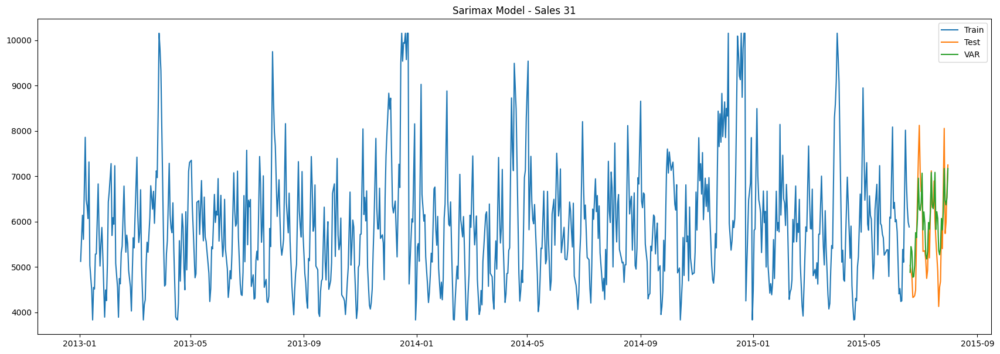

In [144]:
predict_SariMax(Train_Test_Data[store_num],store_num,mod,res,exogV=exog_variables)
plot_Prediction(Train_Test_Data[store_num],store_num,res,'Sarimax')

In [145]:
get_Model_Metrics(Train_Test_Data[store_num],store_num,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,800.60,17.05
1,Sarimax for Store 1,477.60,9.20
2,VarMax for Store 3,1102.39,14.20
3,Sarimax for Store 3,954.50,11.45
4,VarMax for Store 8,1303.11,17.06
5,Sarimax for Store 8,919.90,12.29
6,VarMax for Store 9,1547.15,14.97
7,Sarimax for Store 9,1278.95,16.44
8,VarMax for Store 13,1286.90,23.23
9,Sarimax for Store 13,1180.10,19.41


# Summary

### Model performance
* We can observ that for each store Sarimax is performing better than VarMax model.
* Also the performance varies acorss the stores indicating the strong impact of store and the competitors store presence
* based on the above data we can take Sarimax as it has lower RMSE and MAPE value comparatively

# Future Considerations:

Store-Specific Factors: Currently, We have take only specific stores data, We can also build the considering all the store, identify the parameter which has impact across stores.
Then identify store specific features and fine tune the parameter accordingly

Hyperparameter Tuning: Configure Grid mechanism and Randomized Search to find the best hyperparameters for the model.


# Experimentation

We can predict the sales forcast using varius techniques apart from the above mentioned forecasting approaches.
Like LGBR Regression , Machine learning models also like below

* MSTL (from statsmodels.tsa.seasonal):
Description: MSTL stands for "Multiple Seasonal-Trend decomposition using Loess" and is part of the statsmodels library. It's an extension of the STL (Seasonal and Trend decomposition using Loess) method to handle multiple seasonalities.
Use Case: It's particularly useful for time series with more than one type of seasonality (e.g., hourly data with daily and weekly patterns).
Forecasting: While MSTL itself is primarily a decomposition method, it can be used in forecasting by decomposing the time series into trend, seasonal, and residual components. Forecasting can then be performed on the decomposed components, often the trend, using other methods.

* Prophet (from prophet import Prophet):
Description: Prophet is a forecasting tool developed by Facebook that's designed for ease of use with minimal need for tuning. It works well with daily observations that display patterns on different time scales such as holidays, weekly, and yearly seasonality.
Use Case: It's particularly effective for forecasting with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and it handles outliers well.
Forecasting: Prophet is explicitly designed for forecasting. It models time series forecasts as a combination of trend, seasonality, and holidays.

* LGBMRegressor (from lightgbm import LGBMRegressor):
Description: LightGBM (Light Gradient Boosting Machine) is a gradient boosting framework that uses tree-based learning algorithms. The LGBMRegressor is specifically for regression tasks.
Use Case: While not specifically designed for time series forecasting, it can be highly effective when the data is structured correctly (e.g., using lag features, rolling window statistics, etc.). It's particularly useful for datasets where the relationship between the input and output variables is complex and non-linear.
Forecasting: To use LGBMRegressor for forecasting, you typically need to engineer features from the time series data (like lags, moving averages, etc.) to capture the temporal dependencies. It's powerful for handling large datasets and can model complex relationships, including seasonality and trends, with the right features.
